# Project "Analysis of business indicators of a mobile application"

### Project Description
We work in a company that owns the Procrastinate Pro+ entertainment application. Despite huge investments in advertising, the company has been suffering losses for the last few months.
Our task is to understand the reasons and help the company to become a plus.
There is data on users attracted from May 1 to October 27, 2019:
server log with data about their visits,
unloading of their purchases for this period,
advertising expenses.
We have to study:
where do users come from and what devices do they use,
how much does it cost to attract users from various advertising channels;
how much money each client brings,
when the costs of attracting a client pay off,
what factors prevent attracting customers.

### Data description
The visits_info_short.csv file stores the server log with information about site visits, orders_info_short.csv — information about orders, and costs_info_short.csv — information about advertising expenses.
what factors prevent attracting customers.

visits_info_short.csv structure:
- User Id — unique user ID,
- Region — user's country,
- Device — user's device type,
- Channel — id of the transition source,
- Session Start — session start date and time,
- Session End — session end date and time.

orders_info_short.csv structure:
- User Id — unique user ID,
- Event Dt — date and time of purchase,
- Revenue — order amount.

costs_info_short.csv structure:
- dt — date of the advertising campaign,
- Channel — ID of the advertising source,
- costs — expenses for this campaign.

### Work plan:
1. Open the data files and study the general information. Next, we will check the data for omissions and duplicates.
2. Define functions for calculating and analyzing LTV, ROI, retention and conversion.
3. We will conduct a research analysis of the data, study the following information about users:
- We will determine the minimum and maximum dates for attracting users.
- Let's find out from which countries users come to the application and which country accounts for the most paying users. 
- Let's determine which devices are used by customers and which devices are preferred by paying users.
- Let's study the advertising sources of attraction and determine the channels from which the most paying users came.
4. Let's study the marketing costs, we will get the following data:
- Let's calculate the total amount of marketing expenses.
- Let's find out how the expenses are distributed by advertising sources.
- Let's build a visualization of the dynamics of changes in expenses over time (by weeks and months) for each source.
- Let's find out how much it cost on average to attract one user (CAC) from each source.
5. Let's evaluate the payback of advertising, we will get the following data:
- Let's analyze the payback of advertising as a whole.
- Let's check the user conversion and the dynamics of its changes. We will do the same with user retention.
- Let's analyze the payback of advertising by device.
- Let's analyze the payback of advertising by country.
- Let's analyze the payback of advertising by advertising channels.
- Let's draw conclusions from the data obtained.
6. We will write the final conclusion about the information received during the research and give recommendations for the advertising department.

### Download the data and prepare it for analysis

In [1]:
# Importing the libraries that we will need in this project 
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter("ignore")
import pandas as pd
from datetime import datetime, timedelta
import numpy as np
from matplotlib import pyplot as plt
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
# Let's read the data from the csv file into a dataframe, save it to a variable, and study the general information about the table
try:
    visits = pd.read_csv('visits_info_short.csv')
except:
    visits = pd.read_csv('https://code.s3.yandex.net/datasets/visits_info_short.csv')



In [3]:
visits.head(10)

,User Id,Region,Device,Channel,Session Start,Session End
0,981449118918,United States,iPhone,organic,2019-05-01 02:36:01,2019-05-01 02:45:01
1,278965908054,United States,iPhone,organic,2019-05-01 04:46:31,2019-05-01 04:47:35
2,590706206550,United States,Mac,organic,2019-05-01 14:09:25,2019-05-01 15:32:08
3,326433527971,United States,Android,TipTop,2019-05-01 00:29:59,2019-05-01 00:54:25
4,349773784594,United States,Mac,organic,2019-05-01 03:33:35,2019-05-01 03:57:40
5,90242400005,United States,iPhone,RocketSuperAds,2019-05-01 07:14:52,2019-05-01 08:19:56
6,43958116050,United States,Android,organic,2019-05-01 09:03:21,2019-05-01 10:08:39
7,185365244969,United States,iPhone,organic,2019-05-01 09:37:03,2019-05-01 10:00:43
8,446013509831,United States,iPhone,RocketSuperAds,2019-05-01 10:26:00,2019-05-01 10:59:17
9,100970711362,United States,Mac,TipTop,2019-05-01 04:39:53,2019-05-01 04:57:05


In [4]:
visits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 309901 entries, 0 to 309900
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   User Id        309901 non-null  int64 
 1   Region         309901 non-null  object
 2   Device         309901 non-null  object
 3   Channel        309901 non-null  object
 4   Session Start  309901 non-null  object
 5   Session End    309901 non-null  object
dtypes: int64(1), object(5)
memory usage: 14.2+ MB


In [5]:
# Rename the column names in the table
visits.columns = ['user_id', 'region', 'device', 'channel', 'session_start', 'session_end']

##### Let's check how many gaps there are in our table

In [6]:
visits.isna().sum()

user_id          0
region           0
device           0
channel          0
session_start    0
session_end      0
dtype: int64

##### Let's check how many explicit duplicates there are in our table

In [7]:
visits.duplicated().sum()

0

**No obvious duplicates were found.**

##### Let's check for implicit duplicates in our table

In [8]:
for col in visits.columns:
    print(visits[col].unique())

[981449118918 278965908054 590706206550 ... 519022174024 354394066496
 279181973476]
['United States' 'UK' 'France' 'Germany']
['iPhone' 'Mac' 'Android' 'PC']
['organic' 'TipTop' 'RocketSuperAds' 'YRabbit' 'FaceBoom' 'MediaTornado'
 'AdNonSense' 'LeapBob' 'WahooNetBanner' 'OppleCreativeMedia'
 'lambdaMediaAds']
['2019-05-01 02:36:01' '2019-05-01 04:46:31' '2019-05-01 14:09:25' ...
 '2019-10-31 01:40:48' '2019-10-31 07:37:34' '2019-10-31 14:17:43']
['2019-05-01 02:45:01' '2019-05-01 04:47:35' '2019-05-01 15:32:08' ...
 '2019-10-31 01:41:31' '2019-10-31 07:37:55' '2019-10-31 15:17:04']


**No implicit duplicates were found.**

In [9]:
# Let's read the data from the csv file into a dataframe, save it to a variable, and study the general information about the table
try:
    orders = pd.read_csv('orders_info_short.csv')
except:
    orders = pd.read_csv('https://code.s3.yandex.net/datasets/orders_info_short.csv')

In [10]:
orders.head(10)

,User Id,Event Dt,Revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99
5,129100331057,2019-05-01 01:56:28,4.99
6,626807144131,2019-05-01 02:39:21,4.99
7,914062168985,2019-05-01 02:02:18,4.99
8,769669137453,2019-05-01 03:39:47,4.99
9,434198630691,2019-05-01 18:16:50,5.99


In [11]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40212 entries, 0 to 40211
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   User Id   40212 non-null  int64  
 1   Event Dt  40212 non-null  object 
 2   Revenue   40212 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 942.6+ KB


In [12]:
# Rename the column names in the table
orders.columns = ['user_id', 'event_dt', 'revenue']

In [13]:
orders.head(10)

,user_id,event_dt,revenue
0,188246423999,2019-05-01 23:09:52,4.99
1,174361394180,2019-05-01 12:24:04,4.99
2,529610067795,2019-05-01 11:34:04,4.99
3,319939546352,2019-05-01 15:34:40,4.99
4,366000285810,2019-05-01 13:59:51,4.99
5,129100331057,2019-05-01 01:56:28,4.99
6,626807144131,2019-05-01 02:39:21,4.99
7,914062168985,2019-05-01 02:02:18,4.99
8,769669137453,2019-05-01 03:39:47,4.99
9,434198630691,2019-05-01 18:16:50,5.99


##### Let's check how many gaps there are in our table

In [14]:
orders.isna().sum()

user_id     0
event_dt    0
revenue     0
dtype: int64

##### Let's check how many explicit duplicates there are in our table

In [15]:
orders.duplicated().sum()

0

**No obvious duplicates were found.**

##### Let's check for implicit duplicates in our table

In [16]:
for col in orders.columns:
    print(orders[col].unique())

[188246423999 174361394180 529610067795 ... 492983055500 651604369137
 168548862926]
['2019-05-01 23:09:52' '2019-05-01 12:24:04' '2019-05-01 11:34:04' ...
 '2019-10-31 06:17:29' '2019-10-31 22:46:19' '2019-10-31 13:29:06']
[ 4.99  5.99  9.99 49.99 19.99]


**No implicit duplicates were found.**

In [17]:
# Let's read the data from the csv file into a dataframe, save it to a variable, and study the general information about the table
try:
    costs = pd.read_csv('costs_info_short.csv')
except:
    costs = pd.read_csv('https://code.s3.yandex.net/datasets/costs_info_short.csv')

In [18]:
costs.head()

,dt,Channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1


In [19]:
costs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1800 entries, 0 to 1799
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   dt       1800 non-null   object 
 1   Channel  1800 non-null   object 
 2   costs    1800 non-null   float64
dtypes: float64(1), object(2)
memory usage: 42.3+ KB


In [20]:
# Rename the column names in the table
costs.columns = ['dt', 'channel', 'costs']

In [21]:
costs.head()

,dt,channel,costs
0,2019-05-01,FaceBoom,113.3
1,2019-05-02,FaceBoom,78.1
2,2019-05-03,FaceBoom,85.8
3,2019-05-04,FaceBoom,136.4
4,2019-05-05,FaceBoom,122.1


##### Let's check how many gaps there are in our table

In [22]:
costs.isna().sum()

dt         0
channel    0
costs      0
dtype: int64

##### Let's check how many explicit duplicates there are in our table

In [23]:
costs.duplicated().sum()

0

##### Let's check for implicit duplicates in our table

In [24]:
for col in costs.columns:
    print(costs[col].unique())

['2019-05-01' '2019-05-02' '2019-05-03' '2019-05-04' '2019-05-05'
 '2019-05-06' '2019-05-07' '2019-05-08' '2019-05-09' '2019-05-10'
 '2019-05-11' '2019-05-12' '2019-05-13' '2019-05-14' '2019-05-15'
 '2019-05-16' '2019-05-17' '2019-05-18' '2019-05-19' '2019-05-20'
 '2019-05-21' '2019-05-22' '2019-05-23' '2019-05-24' '2019-05-25'
 '2019-05-26' '2019-05-27' '2019-05-28' '2019-05-29' '2019-05-30'
 '2019-05-31' '2019-06-01' '2019-06-02' '2019-06-03' '2019-06-04'
 '2019-06-05' '2019-06-06' '2019-06-07' '2019-06-08' '2019-06-09'
 '2019-06-10' '2019-06-11' '2019-06-12' '2019-06-13' '2019-06-14'
 '2019-06-15' '2019-06-16' '2019-06-17' '2019-06-18' '2019-06-19'
 '2019-06-20' '2019-06-21' '2019-06-22' '2019-06-23' '2019-06-24'
 '2019-06-25' '2019-06-26' '2019-06-27' '2019-06-28' '2019-06-29'
 '2019-06-30' '2019-07-01' '2019-07-02' '2019-07-03' '2019-07-04'
 '2019-07-05' '2019-07-06' '2019-07-07' '2019-07-08' '2019-07-09'
 '2019-07-10' '2019-07-11' '2019-07-12' '2019-07-13' '2019-07-14'
 '2019-07-

**No implicit duplicates were found.**

In [25]:
# Let's translate the date and time columns into the format we need
visits['session_start'] = pd.to_datetime(visits['session_start'])
orders['event_dt'] = pd.to_datetime(orders['event_dt'])
costs['dt'] = pd.to_datetime(costs['dt']).dt.date

#### Conclusion: at this stage, we have studied the general information about the source data, checked for gaps in the tables, checked the data for duplicates. No duplicates or omissions were found.

### Let's define functions for calculating and analyzing LTV, ROI, retention and conversion.

These are functions for calculating metric values:

- `get_profiles()` — to create user profiles,
- `get_retention()` — to calculate Retention Rate,
- `get_conversion()` — to calculate conversion,
- `get_ltv()` — for calculating LTV.

As well as functions for plotting:

- `filter_data()` — for smoothing data,
- `plot_retention()` — for plotting Retention Rate,
- `plot_conversion()` — for plotting conversion,
- `plot_ltv_roi` — for LTV and ROI visualization.

##### Let's define a function for creating user profiles

In [26]:
# function for creating user profiles

def get_profiles(sessions, orders, ad_costs):

    # we find the parameters of the first visits
    profiles = (
        sessions.sort_values(by=['user_id', 'session_start'])
        .groupby('user_id')
        .agg(
            {
                'session_start': 'first',
                'channel': 'first',
                'device': 'first',
                'region': 'first',
            }
        )
        .rename(columns={'session_start': 'first_ts'})
        .reset_index()
    )

    # for cohort analysis, we determine the date of the first visit
    # and the first day of the month in which this visit occurred
    profiles['dt'] = profiles['first_ts'].dt.date
    profiles['month'] = profiles['first_ts'].astype('datetime64[M]')

    # adding a sign of paying users
    profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())


    # counting the number of unique users
    # with the same source and date of attraction
    new_users = (
        profiles.groupby(['dt', 'channel'])
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id': 'unique_users'})
        .reset_index()
    )

    # we combine spending on advertising and the number of attracted users
    ad_costs = ad_costs.merge(new_users, on=['dt', 'channel'], how='left')

    # we divide advertising expenses by the number of attracted users
    ad_costs['acquisition_cost'] = ad_costs['costs'] / ad_costs['unique_users']

    # adding the cost of attraction to profiles
    profiles = profiles.merge(
        ad_costs[['dt', 'channel', 'acquisition_cost']],
        on=['dt', 'channel'],
        how='left',
    )

    # the cost of attracting organic users is zero
    profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)

    return profiles

In [27]:
# Let's check that the function is working correctly
profiles = get_profiles(visits, orders, costs)
profiles.head()

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769


##### Let's define a function for calculating retention

In [28]:
# function for calculating retention

def get_retention(
    profiles,
    sessions,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # adding the payer column to the dimensions list being passed
    dimensions = ['payer'] + dimensions

    # we exclude users who have not "lived up" to the horizon of analysis
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # we collect "raw" data to calculate retention
    result_raw = result_raw.merge(
        sessions[['user_id', 'session_start']], on='user_id', how='left'
    )
    result_raw['lifetime'] = (
        result_raw['session_start'] - result_raw['first_ts']
    ).dt.days

    # a function for grouping a table by desired attributes
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # we get the retention table
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # we get a table of retention dynamics
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # we return both tables and raw data
    return result_raw, result_grouped, result_in_time

In [29]:
# Let's check that the function is working correctly
observation_date = datetime(2019, 5, 22).date()  # moment of analysis
horizon_days = 7  # horizon of analysis 
retention_check_raw, retention_check, retention_check_dynamic  = get_retention(
    profiles,
    visits,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
)

In [30]:
display(retention_check)
retention_check_dynamic

,cohort_size,0,1,2,3,4,5,6
payer,,,,,,,,
False,13560,1.0,0.179056,0.087094,0.052876,0.034218,0.026106,0.017109
True,656,1.0,0.480183,0.352134,0.297256,0.257622,0.230183,0.221037


cohort_size    0         1         2         3         4  \
payer dt                                                                     
False 2019-05-01          868  1.0  0.191244  0.074885  0.047235  0.031106   
      2019-05-02          728  1.0  0.185440  0.111264  0.046703  0.035714   
      2019-05-03          807  1.0  0.175960  0.091698  0.053284  0.026022   
      2019-05-04          960  1.0  0.179167  0.096875  0.065625  0.027083   
      2019-05-05          935  1.0  0.193583  0.096257  0.065241  0.034225   
      2019-05-06          952  1.0  0.155462  0.089286  0.048319  0.036765   
      2019-05-07          846  1.0  0.186761  0.078014  0.061466  0.029551   
      2019-05-08          742  1.0  0.173854  0.086253  0.037736  0.029650   
      2019-05-09          759  1.0  0.172596  0.089592  0.059289  0.036891   
      2019-05-10          904  1.0  0.174779  0.078540  0.045354  0.034292   
      2019-05-11          975  1.0  0.167179  0.078974  0.056410  0.034872   
      2019-05-12          879  1.0  0.176337  0.102389  0.051195  0.039818   
      2019-05-13          891  1.0  0.177329  0.081930  0.054994  0.037037   
      2019-05-14          807  1.0  0.195787  0.092937  0.066914  0.044610   
      2019-05-15          704  1.0  0.180398  0.073864  0.034091  0.039773   
      2019-05-16          803  1.0  0.183064  0.070984  0.044832  0.031133   
True  2019-05-01           41  1.0  0.487805  0.390244  0.439024  0.219512   
      2019-05-02           30  1.0  0.566667  0.300000  0.300000  0.300000   
      2019-05-03           42  1.0  0.476190  0.500000  0.285714  0.357143   
      2019-05-04           55  1.0  0.436364  0.272727  0.327273  0.309091   
      2019-05-05           35  1.0  0.457143  0.371429  0.342857  0.228571   
      2019-05-06           62  1.0  0.483871  0.338710  0.225806  0.258065   
      2019-05-07           42  1.0  0.547619  0.428571  0.309524  0.261905   
      2019-05-08           40  1.0  0.475000  0.325000  0.200000  0.300000   
      2019-05-09           42  1.0  0.476190  0.214286  0.261905  0.285714   
      2019-05-10           41  1.0  0.487805  0.390244  0.365854  0.219512   
      2019-05-11           49  1.0  0.489796  0.224490  0.265306  0.183673   
      2019-05-12           39  1.0  0.435897  0.358974  0.410256  0.128205   
      2019-05-13           37  1.0  0.378378  0.432432  0.216216  0.189189   
      2019-05-14           26  1.0  0.384615  0.384615  0.153846  0.307692   
      2019-05-15           38  1.0  0.421053  0.421053  0.342105  0.263158   
      2019-05-16           37  1.0  0.675676  0.351351  0.297297  0.324324   

                         5         6  
payer dt                              
False 2019-05-01  0.021889  0.023041  
      2019-05-02  0.017857  0.015110  
      2019-05-03  0.035936  0.022305  
      2019-05-04  0.016667  0.019792  
      2019-05-05  0.020321  0.020321  
      2019-05-06  0.026261  0.013655  
      2019-05-07  0.021277  0.018913  
      2019-05-08  0.024259  0.013477  
      2019-05-09  0.027668  0.006588  
      2019-05-10  0.019912  0.018805  
      2019-05-11  0.027692  0.010256  
      2019-05-12  0.040956  0.020478  
      2019-05-13  0.025814  0.022447  
      2019-05-14  0.028501  0.017348  
      2019-05-15  0.031250  0.017045  
      2019-05-16  0.033624  0.012453  
True  2019-05-01  0.219512  0.170732  
      2019-05-02  0.266667  0.233333  
      2019-05-03  0.357143  0.166667  
      2019-05-04  0.254545  0.200000  
      2019-05-05  0.257143  0.142857  
      2019-05-06  0.225806  0.258065  
      2019-05-07  0.214286  0.261905  
      2019-05-08  0.200000  0.150000  
      2019-05-09  0.166667  0.166667  
      2019-05-10  0.195122  0.243902  
      2019-05-11  0.204082  0.183673  
      2019-05-12  0.128205  0.153846  
      2019-05-13  0.270270  0.162162  
      2019-05-14  0.307692  0.384615  
      2019-05-15  0.289474  0.315789  
      2019-05-16  0.162162  0.405405

##### Let's set a function for calculating the conversion

In [31]:
# conversion calculation function

def get_conversion(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # we exclude users who have not "lived up" to the horizon of analysis
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')

    # we determine the date and time of the first purchase for each user
    first_purchases = (
        purchases.sort_values(by=['user_id', 'event_dt'])
        .groupby('user_id')
        .agg({'event_dt': 'first'})
        .reset_index()
    )

    # adding purchase data to profiles
    result_raw = result_raw.merge(
        first_purchases[['user_id', 'event_dt']], on='user_id', how='left'
    )

    # we calculate the lifetime for each purchase
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days

    # group by cohort if there is nothing in dimensions
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users' 
        dimensions = dimensions + ['cohort']

    # a function for grouping a table by desired attributes
    def group_by_dimensions(df, dims, horizon_days):
        result = df.pivot_table(
            index=dims, columns='lifetime', values='user_id', aggfunc='nunique'
        )
        result = result.fillna(0).cumsum(axis = 1)
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # divide each "cell" in a row by the size of the cohort
        # and we get the conversion rate
        result = result.div(result['cohort_size'], axis=0)
        result = result[['cohort_size'] + list(range(horizon_days))]
        result['cohort_size'] = cohort_sizes
        return result

    # we get the conversion table
    result_grouped = group_by_dimensions(result_raw, dimensions, horizon_days)

    # for the conversion dynamics table, we remove 'cohort' from dimensions
    if 'cohort' in dimensions: 
        dimensions = []

    # we get a table of conversion dynamics
    result_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    # we return both tables and raw data
    return result_raw, result_grouped, result_in_time

In [32]:
# Let's check that the function is working correctly
observation_date = datetime(2019, 5, 22).date()  # moment of analysis
horizon_days = 7  # horizon of analysis
conversion_check_raw, conversion_check, conversion_check_dynamic  = get_conversion(
    profiles,
    orders,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
)

In [33]:
display(conversion_check)
conversion_check_dynamic

,cohort_size,0.0,1.0,2.0,3.0,4.0,5.0,6.0
cohort,,,,,,,,
All users,14216,0.030459,0.035453,0.038267,0.039463,0.04101,0.041362,0.042065


,cohort_size,0.0,1.0,2.0,3.0,4.0,5.0,6.0
dt,,,,,,,,
2019-05-01,909,0.031903,0.036304,0.038504,0.038504,0.040704,0.040704,0.040704
2019-05-02,758,0.029024,0.035620,0.036939,0.036939,0.036939,0.036939,0.036939
2019-05-03,849,0.031802,0.037691,0.043581,0.044759,0.047114,0.047114,0.047114
2019-05-04,1015,0.035468,0.039409,0.040394,0.042365,0.047291,0.047291,0.048276
2019-05-05,970,0.023711,0.026804,0.028866,0.030928,0.032990,0.032990,0.032990
2019-05-06,1014,0.032544,0.042406,0.045365,0.049310,0.051282,0.052268,0.054241
2019-05-07,888,0.031532,0.036036,0.040541,0.041667,0.041667,0.041667,0.042793
2019-05-08,782,0.035806,0.040921,0.042199,0.043478,0.044757,0.047315,0.047315
2019-05-09,801,0.036205,0.042447,0.044944,0.044944,0.044944,0.046192,0.047441


##### Let's define a function for calculating LTV and ROI

In [34]:
# function for calculating LTV and ROI

def get_ltv(
    profiles,
    purchases,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
):

    # we exclude users who have not "lived up" to the horizon of analysis
    last_suitable_acquisition_date = observation_date
    if not ignore_horizon:
        last_suitable_acquisition_date = observation_date - timedelta(
            days=horizon_days - 1
        )
    result_raw = profiles.query('dt <= @last_suitable_acquisition_date')
    # adding data about purchases in the profile
    result_raw = result_raw.merge(
        purchases[['user_id', 'event_dt', 'revenue']], on='user_id', how='left'
    )
    # we calculate the user's lifetime for each purchase
    result_raw['lifetime'] = (
        result_raw['event_dt'] - result_raw['first_ts']
    ).dt.days
    # group by cohort if there is nothing in dimensions
    if len(dimensions) == 0:
        result_raw['cohort'] = 'All users'
        dimensions = dimensions + ['cohort']

    # grouping function by desired attributes
    def group_by_dimensions(df, dims, horizon_days):
        # building a "triangular" revenue table
        result = df.pivot_table(
            index=dims, columns='lifetime', values='revenue', aggfunc='sum'
        )
        # we find the amount of revenue with accumulation
        result = result.fillna(0).cumsum(axis=1)
        # we calculate the cohort sizes
        cohort_sizes = (
            df.groupby(dims)
            .agg({'user_id': 'nunique'})
            .rename(columns={'user_id': 'cohort_size'})
        )
        # we combine the cohort sizes and the revenue table
        result = cohort_sizes.merge(result, on=dims, how='left').fillna(0)
        # counting LTV: divide each "cell" in a row by the size of the cohort
        result = result.div(result['cohort_size'], axis=0)
        # we exclude all lifetimes exceeding the analysis horizon
        result = result[['cohort_size'] + list(range(horizon_days))]
        # restoring cohort sizes
        result['cohort_size'] = cohort_sizes

        # we collect a dataframe with user data and CAC values, 
        # adding parameters from dimensions
        cac = df[['user_id', 'acquisition_cost'] + dims].drop_duplicates()

        # we calculate the average CAC according to the parameters from dimensions
        cac = (
            cac.groupby(dims)
            .agg({'acquisition_cost': 'mean'})
            .rename(columns={'acquisition_cost': 'cac'})
        )

        # counting ROI: dividing LTV by CAC
        roi = result.div(cac['cac'], axis=0)

        # deleting rows with infinite ROI
        roi = roi[~roi['cohort_size'].isin([np.inf])]

        # restoring cohort sizes in the ROI table
        roi['cohort_size'] = cohort_sizes

        # adding CAC to the ROI table
        roi['cac'] = cac['cac']

        # in the final table, we leave the cohort sizes, CAC
        # and ROI in lifetimes that do not exceed the analysis horizon
        roi = roi[['cohort_size', 'cac'] + list(range(horizon_days))]

        # we return the LTV and ROI tables
        return result, roi

    # we get the LTV and ROI tables
    result_grouped, roi_grouped = group_by_dimensions(
        result_raw, dimensions, horizon_days
    )

    # for dynamics tables, we remove 'cohort' from dimensions
    if 'cohort' in dimensions:
        dimensions = []

    # we get tables of LTV and ROI dynamics
    result_in_time, roi_in_time = group_by_dimensions(
        result_raw, dimensions + ['dt'], horizon_days
    )

    return (
        result_raw,  # raw data
        result_grouped,  # LTV table
        result_in_time,  # LTV dynamics table
        roi_grouped,  # ROI table
        roi_in_time,  # ROI dynamics table
    ) 

In [35]:
# Let's check that the function is working correctly
observation_date = datetime(2019, 5, 22).date()  # moment of analysis
horizon_days = 7  # horizon of analysis
ltv_check_raw, ltv_check, ltv_check_dynamic, roi_check, roi_check_dynamic  = get_ltv(
    profiles,
    orders,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
)

In [36]:
display(ltv_check)
ltv_check_dynamic

,cohort_size,0.0,1.0,2.0,3.0,4.0,5.0,6.0
cohort,,,,,,,,
All users,14216,0.174751,0.246237,0.28794,0.327681,0.370448,0.402047,0.427321


,cohort_size,0.0,1.0,2.0,3.0,4.0,5.0,6.0
dt,,,,,,,,
2019-05-01,909,0.160297,0.215193,0.260209,0.294246,0.316205,0.316205,0.327184
2019-05-02,758,0.157995,0.302942,0.335858,0.381939,0.408272,0.441201,0.454367
2019-05-03,849,0.165748,0.249211,0.326796,0.379694,0.503227,0.550259,0.556137
2019-05-04,1015,0.232138,0.286217,0.315714,0.359970,0.459369,0.518365,0.528197
2019-05-05,970,0.140969,0.229546,0.244979,0.265557,0.291278,0.317000,0.332433
2019-05-06,1014,0.172239,0.242120,0.291331,0.340542,0.374990,0.394675,0.453738
2019-05-07,888,0.220315,0.276509,0.338322,0.383277,0.416993,0.439471,0.473187
2019-05-08,782,0.185051,0.236100,0.287161,0.299923,0.333107,0.377775,0.403299
2019-05-09,801,0.188140,0.262896,0.287815,0.318964,0.370050,0.401199,0.432347


##### Let's set a function for smoothing the frame

In [37]:
# function for smoothing the frame

def filter_data(df, window):
    # we use a moving average for each column
    for column in df.columns.values:
        df[column] = df[column].rolling(window).mean() 
    return df 

##### Let's define a function for visualizing retention

In [38]:
def plot_retention(retention, retention_history, horizon, window=7):

    # setting the grid size for graphs
    plt.figure(figsize=(15, 10))

    # we exclude cohort sizes and retention of the first day
    retention = retention.drop(columns=['cohort_size', 0])
    # in the dynamics table, we leave only the necessary lifetime
    retention_history = retention_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # if only payer is in the retention table indexes,
    # adding the second attribute — cohort
    if retention.index.nlevels == 1:
        retention['cohort'] = 'All users'
        retention = retention.reset_index().set_index(['cohort', 'payer'])

    # the graph table has two columns and two rows, four cells
    # in the first one, we build retention curves for paying users
    ax1 = plt.subplot(2, 2, 1)
    retention.query('payer == True').droplevel('payer').T.plot(
        grid=True, ax=ax1
    )
    plt.legend()
    plt.xlabel('Life time')
    plt.title('Retention of paying users')

    # in the second cell, we construct retention curves for non-paying
    # vertical axis — from the graph from the first cell
    ax2 = plt.subplot(2, 2, 2, sharey=ax1)
    retention.query('payer == False').droplevel('payer').T.plot(
        grid=True, ax=ax2
    )
    plt.legend()
    plt.xlabel('Life time')
    plt.title('Retention of non-paying users')

    # in the third cell — the dynamics of retention of paying
    ax3 = plt.subplot(2, 2, 3)
    # getting the column names for the pivot table
    columns = [
        name
        for name in retention_history.index.names
        if name not in ['dt', 'payer']
    ]
    # we filter the data and build a graph
    filtered_data = retention_history.query('payer == True').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Date of attraction')
    plt.title(
        'Dynamics of retention of paying users on the {}th day'.format(
            horizon
        )
    )

    # в чётвертой ячейке — динамика удержания неплатящих
    ax4 = plt.subplot(2, 2, 4, sharey=ax3)
    # фильтруем данные и строим график
    filtered_data = retention_history.query('payer == False').pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax4)
    plt.xlabel('Date of attraction')
    plt.title(
        'Dynamics of retention of non-paying users on the {}th day'.format(
            horizon
        )
    )
    
    plt.tight_layout()
    plt.show() 

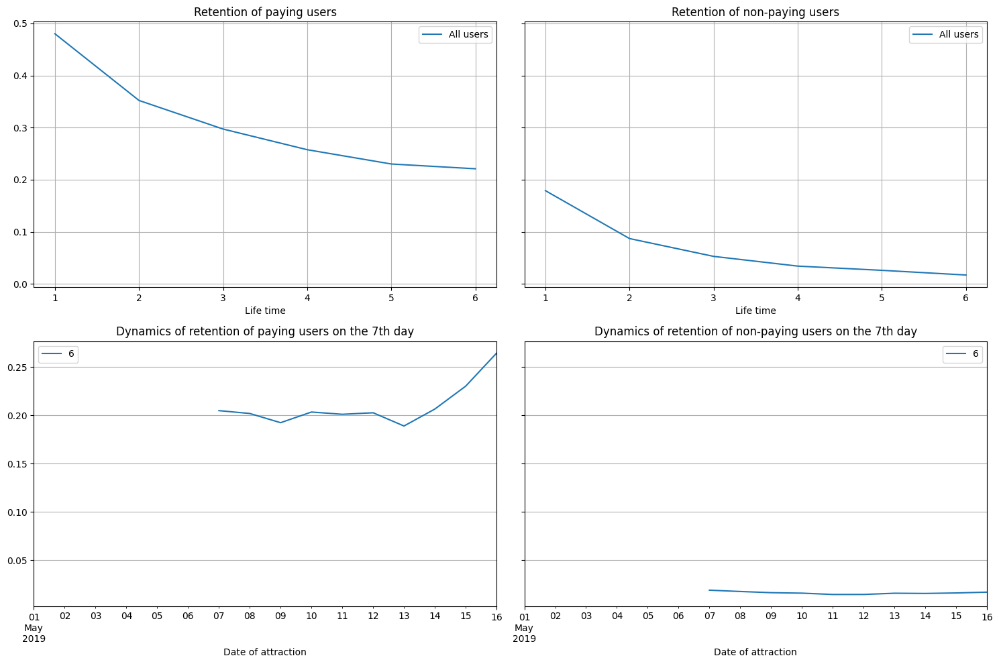

In [39]:
# Let's check that the function is working correctly
plot_retention(retention_check, retention_check_dynamic, 7, window=7)

In [111]:
# conversion visualization function

def plot_conversion(conversion, conversion_history, horizon, window=7):

    # setting the grid size for graphs
    plt.figure(figsize=(15, 5))

    # exclude cohort sizes
    conversion = conversion.drop(columns=['cohort_size'])
    # in the dynamics table, we leave only the necessary lifetime
    conversion_history = conversion_history.drop(columns=['cohort_size'])[
        [horizon - 1]
    ]

    # the first graph is conversion curves
    ax1 = plt.subplot(1, 2, 1)
    conversion.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Life time')
    plt.title('User conversion')

    # the second graph is the conversion dynamics
    ax2 = plt.subplot(1, 2, 2, sharey=ax1)
    columns = [
        # the columns of the pivot table will be all the columns of the index, except for the date
        name for name in conversion_history.index.names if name not in ['dt']
    ]
    filtered_data = conversion_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Date of attraction')
    plt.title('Dynamics of user conversion on the {}th day'.format(horizon))

    plt.tight_layout()
    plt.show() 

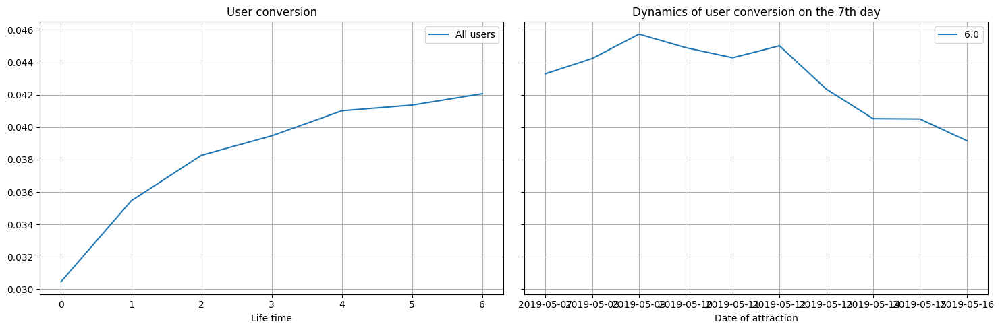

In [112]:
# Let's check that the function is working correctly
plot_conversion(conversion_check, conversion_check_dynamic, 7, window=7)

##### Let's define a function for visualizing LTV and ROI

In [113]:
# function for LTV and ROI visualization

def plot_ltv_roi(ltv, ltv_history, roi, roi_history, horizon, window=7):

    # setting the grid for drawing graphs
    plt.figure(figsize=(30, 20))

    # we exclude cohort sizes from the ltv table
    ltv = ltv.drop(columns=['cohort_size'])
    # in the ltv dynamics table, we leave only the necessary lifetime
    ltv_history = ltv_history.drop(columns=['cohort_size'])[[horizon - 1]]

    # the cost of attraction will be recorded in a separate frame
    cac_history = roi_history[['cac']]

    # we exclude cohort sizes and cac from the roi table
    roi = roi.drop(columns=['cohort_size', 'cac'])
    # in the roi dynamics table, we leave only the necessary lifetime
    roi_history = roi_history.drop(columns=['cohort_size', 'cac'])[
        [horizon - 1]
    ]

    # the first graph is ltv curves
    ax1 = plt.subplot(2, 3, 1)
    ltv.T.plot(grid=True, ax=ax1)
    plt.legend()
    plt.xlabel('Life time')
    plt.title('LTV')

    # the second graph is the dynamics of ltv
    ax2 = plt.subplot(2, 3, 2, sharey=ax1)
    # the columns of the pivot table will be all the columns of the index, except for the date
    columns = [name for name in ltv_history.index.names if name not in ['dt']]
    filtered_data = ltv_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax2)
    plt.xlabel('Date of attraction')
    plt.title('Dynamics of LTV users on the {}th day'.format(horizon))

    # the third graph is the dynamics of cac
    ax3 = plt.subplot(2, 3, 3, sharey=ax1)
    # the columns of the pivot table will be all the columns of the index, except for the date
    columns = [name for name in cac_history.index.names if name not in ['dt']]
    filtered_data = cac_history.pivot_table(
        index='dt', columns=columns, values='cac', aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax3)
    plt.xlabel('Date of attraction')
    plt.title('Dynamics of the cost of attracting users')

    # the fourth graph is the roi curves
    ax4 = plt.subplot(2, 3, 4)
    roi.T.plot(grid=True, ax=ax4)
    plt.axhline(y=1, color='red', linestyle='--', label='Payback level')
    plt.legend()
    plt.xlabel('Life time')
    plt.title('ROI')

    # the fifth chart is the dynamics of roi
    ax5 = plt.subplot(2, 3, 5, sharey=ax4)
    # the columns of the pivot table will be all the columns of the index, except for the date
    columns = [name for name in roi_history.index.names if name not in ['dt']]
    filtered_data = roi_history.pivot_table(
        index='dt', columns=columns, values=horizon - 1, aggfunc='mean'
    )
    filter_data(filtered_data, window).plot(grid=True, ax=ax5)
    plt.axhline(y=1, color='red', linestyle='--', label='Payback level')
    plt.xlabel('Date of attraction')
    plt.title('Dynamics of user ROI on the {}th day'.format(horizon))

    plt.tight_layout()
    plt.show()

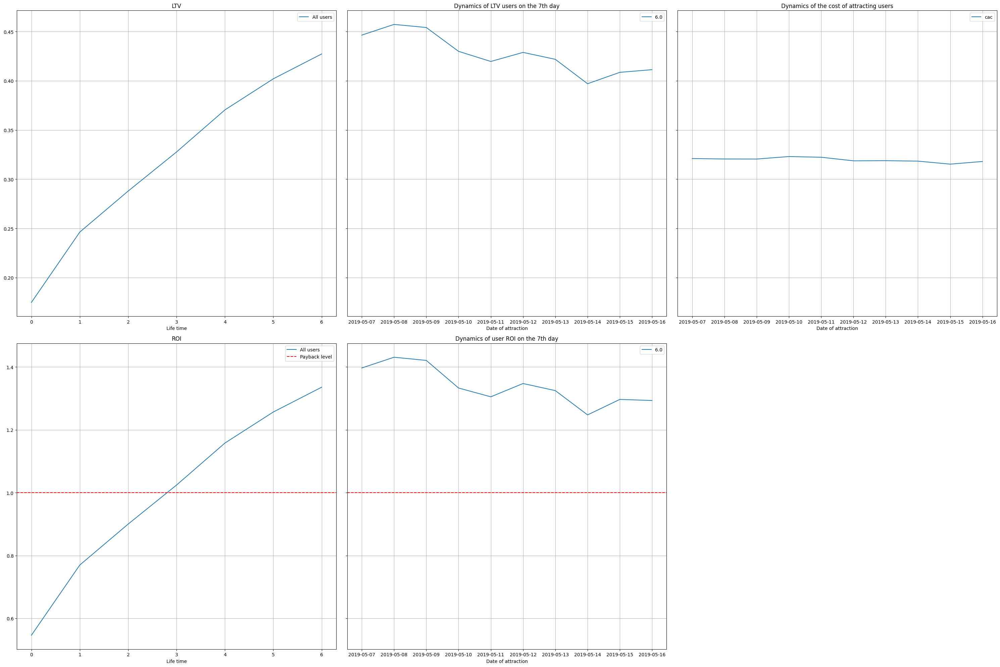

In [114]:
# Let's check that the function is working correctly
plot_ltv_roi(ltv_check, ltv_check_dynamic, roi_check, roi_check_dynamic, 7, window=7)

#### Conclusion: at this stage, we have defined functions for creating a portrait of users, calculating metrics (Retention rate, Conversion rate, LTV, ROI) and visualizing them.

### Research data analysis

- We will create user profiles. We will determine the minimum and maximum dates for attracting users.
- Find out which countries users come to the app from and which country accounts for the most paying users. Let's build a table showing the number of users and the share of payers from each country.
- Find out which devices are used by customers and which devices are preferred by paying users. Let's build a table reflecting the number of users and the share of those paying for each device.
- We will study the advertising sources of attraction and determine the channels from which the most paying users came. Let's build a table reflecting the number of users and the share of payers for each attraction channel.

After each point, we will formulate conclusions.

##### We will determine the minimum and maximum dates for attracting users

In [44]:
display(profiles['dt'].min())
profiles['dt'].max()

datetime.date(2019, 5, 1)

datetime.date(2019, 10, 27)

**The minimum date for attracting users is May 1, 2019.**
**The maximum date for attracting users is October 27, 2019.**

In [45]:
# To begin with, let's create a universal function that will create a pivot table
def table_help(table, dimension=[]):
    result = table.pivot_table(index=dimension, values=['user_id', 'payer'], 
                               aggfunc={'user_id': 'nunique', 'payer': 'mean'}).reset_index()
    result.columns= ['region', 'paying_percentage', 'users_count']
    result.sort_values(by='users_count', ascending=False)
    return result

##### Let's check which countries users come to the app from and which country accounts for the most paying users

In [46]:
users_country = table_help(profiles, dimension=['region'])

In [47]:
users_country.sort_values(by='users_count', ascending=False)

,region,paying_percentage,users_count
3,United States,0.069019,100002
2,UK,0.039829,17575
0,France,0.037994,17450
1,Germany,0.041119,14981


**Users come from the USA, Great Britain, France, Germany.**
**The most paying users are in the USA.**
**The USA is also the leader in the number of attracted users.**

##### Let's check which devices are used by customers and which devices are preferred by paying users

In [48]:
users_device = table_help(profiles, dimension=['device'])

In [49]:
users_device.sort_values(by='users_count', ascending=False)

,region,paying_percentage,users_count
3,iPhone,0.062079,54479
0,Android,0.058518,35032
2,PC,0.050468,30455
1,Mac,0.063644,30042


**Users use iPhone, Android, PC, Mac.**
**Mac accounts for the most paying users.**
**iPhone is the leader in the number of attracted users.**

##### Let's study the advertising sources of attraction and determine the channels from which the most paying users came

In [50]:
users_channel = table_help(profiles, dimension=['channel'])

In [51]:
users_channel.sort_values(by='paying_percentage', ascending=False)

,region,paying_percentage,users_count
1,FaceBoom,0.122049,29144
0,AdNonSense,0.113402,3880
9,lambdaMediaAds,0.104700,2149
6,TipTop,0.096007,19561
5,RocketSuperAds,0.079137,4448
7,WahooNetBanner,0.052964,8553
8,YRabbit,0.038265,4312
3,MediaTornado,0.035747,4364
2,LeapBob,0.030633,8553
4,OppleCreativeMedia,0.027077,8605


**Most of the paying users came from FaceBoom, Ad Non Sense, lambdaMediaAds.**
**At the same time, in general, most users came through an organic traffic source.**

#### Conclusion: at this stage we were engaged in user research. We were able to establish the following:
1. The minimum date for attracting users is May 1, 2019.
2. The maximum date for attracting users is October 27, 2019.
3. Users come from the USA, Great Britain, France, Germany.
4. Most of the paying users are in the USA.
5. Users use iPhone, Android, PC, Mac.
6. Most of the paying users are on Mac.
7. Most of the paying users came from FaceBoom, AdNonSense, lambdaMediaAds.
8. Most of the users came through an organic traffic source.

### Marketing

- Let's calculate the total amount of marketing expenses.
- Let's find out how the expenses are distributed by advertising sources, that is, how much money was spent on each source.
- We will build a visualization of the dynamics of changes in expenses over time (by weeks and months) for each source.
- Find out how much it cost on average to attract one user (CAC) from each source.

Let's write intermediate conclusions.

##### Let's calculate the total amount of marketing expenses

In [52]:
costs['costs'].sum()

105497.30000000002

In [53]:
display(costs['dt'].min())
costs['dt'].max()

datetime.date(2019, 5, 1)

datetime.date(2019, 10, 27)

**The advertising campaign took place from 1.05.2019 to 27.10.2019, 105,497 rubles were spent on it.**

##### Let's see how the expenses are distributed by advertising sources

In [54]:
cost_channel = costs.pivot_table(index='channel', values=['costs'], aggfunc=['sum']).reset_index()

In [55]:
cost_channel.columns = ['channel', 'expenses']

In [56]:
cost_channel['pecentage_of_expense'] = 100 * cost_channel['expenses'] / costs['costs'].sum()

In [57]:
cost_channel.sort_values(by='expenses', ascending=False)

,channel,expenses,pecentage_of_expense
6,TipTop,54751.30,51.898295
1,FaceBoom,32445.60,30.754910
7,WahooNetBanner,5151.00,4.882589
0,AdNonSense,3911.25,3.707441
4,OppleCreativeMedia,2151.25,2.039152
5,RocketSuperAds,1833.00,1.737485
2,LeapBob,1797.60,1.703930
9,lambdaMediaAds,1557.60,1.476436
3,MediaTornado,954.48,0.904744
8,YRabbit,944.22,0.895018


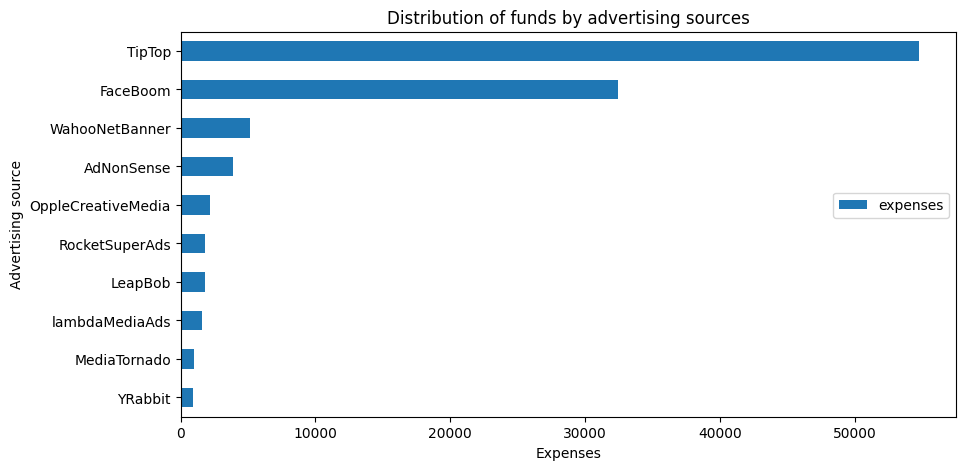

In [115]:
# Visualize the received data
cost_channel.sort_values(by='expenses', ascending=True).plot(x='channel', y='expenses', 
                                                             grid=False, figsize=(10, 5), 
                                                             kind='barh', rot=0, legend = None, 
                                                             title='Distribution of funds by advertising sources')
plt.legend(bbox_to_anchor=(1, 0.6))
plt.xlabel("Expenses")
plt.ylabel("Advertising source")
plt.show()

**Most of the funds were invested in TipTop and FaceBoom advertising sources.**

##### Let's see how advertising spending has changed by time (by weeks and months)

In [59]:
# Let's add columns with month and week number to the costs table
costs['dt'] = pd.to_datetime(costs['dt'])

In [60]:
costs['week'] = costs['dt'].dt.isocalendar().week

In [61]:
costs['month'] = costs['dt'].astype('datetime64[M]')

In [62]:
costs.head(5)

,dt,channel,costs,week,month
0,2019-05-01,FaceBoom,113.3,18,2019-05-01
1,2019-05-02,FaceBoom,78.1,18,2019-05-01
2,2019-05-03,FaceBoom,85.8,18,2019-05-01
3,2019-05-04,FaceBoom,136.4,18,2019-05-01
4,2019-05-05,FaceBoom,122.1,18,2019-05-01


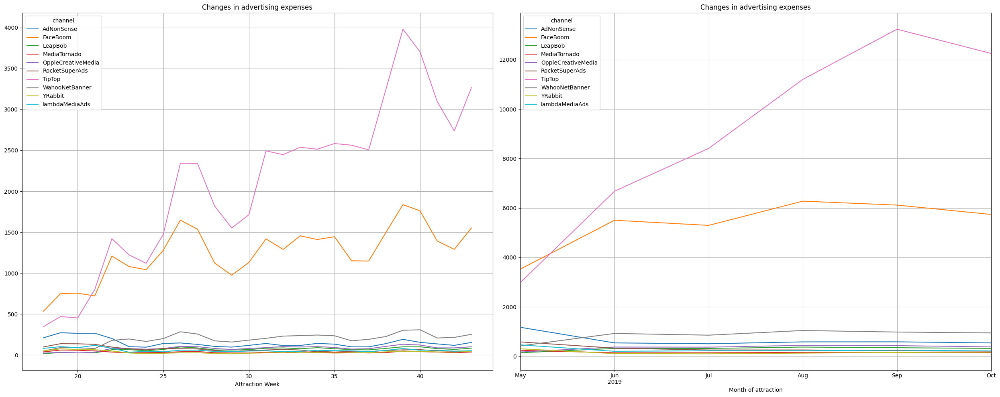

In [116]:
# Let's build graphs showing changes in time costs for all sources
plt.figure(figsize=(25, 10))
ax1 = plt.subplot(1, 2, 1)
cost_2 = costs.reset_index().pivot_table(index='week', columns='channel', values='costs', aggfunc='sum')
cost_2.plot(grid=True, ax=ax1)
plt.xlabel('Attraction Week')
plt.title('Changes in advertising expenses')

ax2 = plt.subplot(1, 2, 2)
ax2.grid(b=True, which='minor', axis='both', linestyle='-')
cost_3 = costs.reset_index().pivot_table(index='month', columns='channel', values='costs', aggfunc='sum')
cost_3.plot(grid=True, ax=ax2)

plt.xlabel('Month of attraction')
plt.title('Changes in advertising expenses')
plt.tight_layout()
plt.show()

**The graphs show that the cost of advertising in TipTop has been constantly growing, while the cost of other sources has hardly changed over time.**

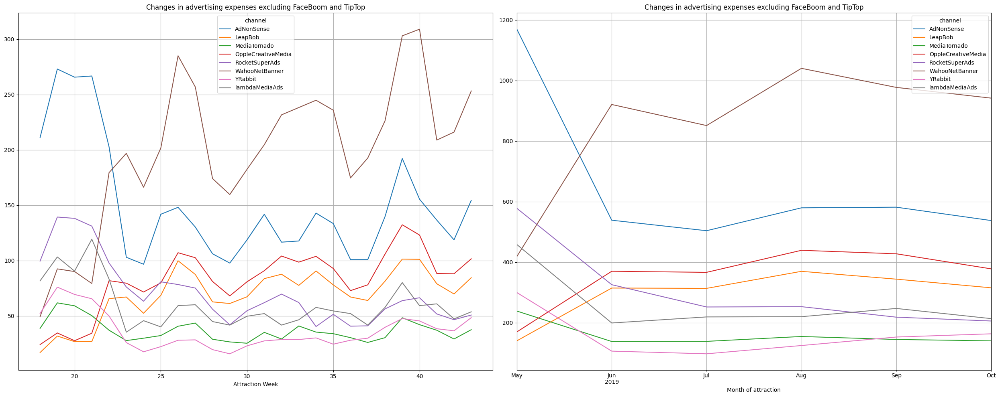

In [117]:
# Let's build graphs showing changes in time costs for all sources except FaceBoom and TipTop
plt.figure(figsize=(25, 10))
ax1 = plt.subplot(1, 2, 1)
cost_by_week = costs.query('channel !="FaceBoom" and channel !="TipTop"').reset_index().pivot_table(index='week', 
                                                                                                    columns='channel', 
                                                                                                    values='costs', 
                                                                                                    aggfunc='sum')
cost_by_week.plot(grid=True, ax=ax1)
plt.xlabel('Attraction Week')
plt.title('Changes in advertising expenses excluding FaceBoom and TipTop')

ax2 = plt.subplot(1, 2, 2)
ax2.grid(b=True, which='minor', axis='both', linestyle='-')
cost_by_month = costs.query('channel !="FaceBoom" and channel !="TipTop"').reset_index().pivot_table(index='month', 
                                                                                                     columns='channel', 
                                                                                                     values='costs', 
                                                                                                     aggfunc='sum')
cost_by_month.plot(grid=True, ax=ax2)

plt.xlabel('Month of attraction')
plt.title('Changes in advertising expenses excluding FaceBoom and TipTop')
plt.tight_layout()
plt.show()

**The graphs show that the cost of advertising in WahooNetBanner was also constantly growing, while the cost of AdNonSense began to decline over time.
In my opinion, this does not look quite logical, since AdNonSense has the second indicator in terms of the percentage of paying users.**
**The costs of other sources have not changed significantly over time.**

##### Let's see how much it cost to attract one user from each source

In [65]:
profiles.head(10)

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
2,6085896,2019-10-01 09:58:33,organic,iPhone,France,2019-10-01,2019-10-01,False,0.000000
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769
5,34186288,2019-05-09 17:29:23,organic,Android,United States,2019-05-09,2019-05-01,False,0.000000
6,38448301,2019-08-16 11:56:00,organic,Android,United States,2019-08-16,2019-08-01,False,0.000000
7,46006712,2019-06-30 03:46:29,AdNonSense,Android,France,2019-06-30,2019-06-01,True,1.008000
8,58263264,2019-05-11 19:18:43,FaceBoom,iPhone,United States,2019-05-11,2019-05-01,False,1.128205
9,59835779,2019-05-11 21:13:47,MediaTornado,iPhone,United States,2019-05-11,2019-05-01,False,0.250435


In [66]:
# Create a pivot table grouped by source, 
# let's calculate for each source the average cost of attracting one user
cac_channel = profiles.pivot_table(index='channel', values=['acquisition_cost'], aggfunc=['mean']).reset_index()

In [67]:
cac_channel.columns = ['channel', 'cac']

In [68]:
cac_channel.sort_values(by='cac', ascending=False)

,channel,cac
6,TipTop,2.799003
1,FaceBoom,1.113286
0,AdNonSense,1.008054
9,lambdaMediaAds,0.724802
7,WahooNetBanner,0.602245
5,RocketSuperAds,0.412095
4,OppleCreativeMedia,0.250000
8,YRabbit,0.218975
3,MediaTornado,0.218717
2,LeapBob,0.210172


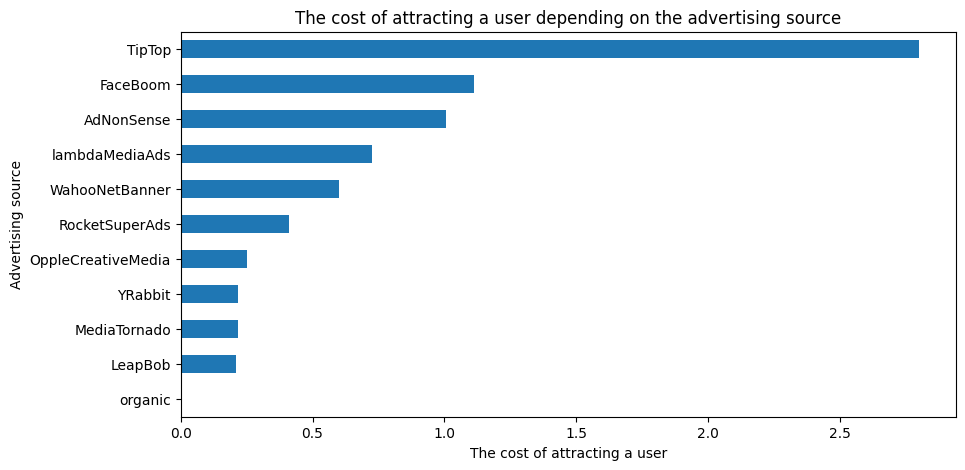

In [118]:
# Visualize the received data
cac_channel.sort_values(by='cac', ascending=True).plot(x='channel', y='cac', 
                                                       grid=False, figsize=(10, 5), kind='barh', 
                                                       rot=0, legend = None, 
                                                       title='The cost of attracting a user depending on the advertising source')
plt.xlabel("The cost of attracting a user")
plt.ylabel("Advertising source")
plt.show()

**According to the graph and the table, it can be seen that the highest cost of attracting one user is from TipTop and FaceBoom sources.**

In [70]:
# Let's find the average cost of attracting a user for the entire project
profiles.loc[profiles['channel'] != "organic", 'acquisition_cost'].mean()

1.1274813239427588

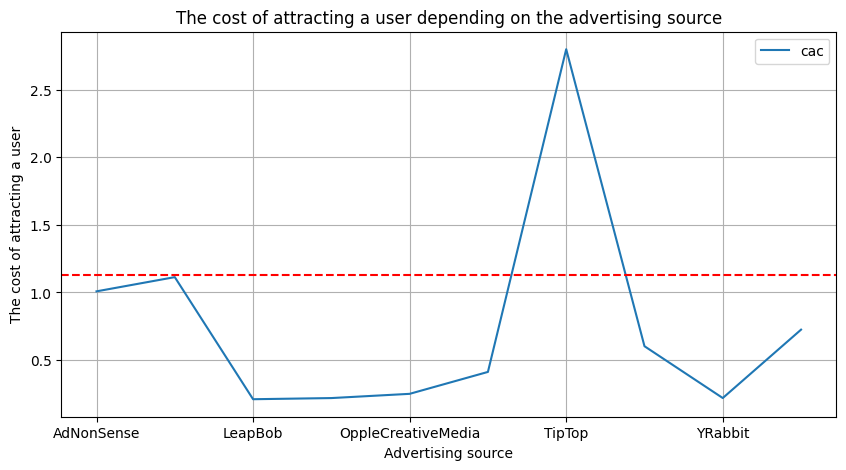

In [119]:
# Visualize the cac_channel table to see which channels the cost of attraction is higher 
# what is the average cost of attraction for the project
cac_channel.query('channel != "organic"').plot(x='channel', 
                                               y='cac', grid=True, figsize=(10, 5), 
                                               title='The cost of attracting a user depending on the advertising source')
plt.ylabel("The cost of attracting a user")
plt.xlabel("Advertising source")
plt.axhline(y=1.13, color='red', linestyle='--', label='The cost of attracting a user for the entire project')
plt.show()

#### Conclusion: at this stage, we studied marketing costs. We were able to establish the following:
1. The advertising campaign was held from 1.05.2019 to 27.10.2019, 105,497 rubles were spent on it
2. Most of the funds were invested in Tip Top and FaceBoom advertising sources.
3. The cost of advertising in FaceBoom has been constantly growing, while the cost of other sources has hardly changed over time.
4. The highest cost of attracting one user from Tip Top and FaceBoom sources.

### Let's evaluate the payback of advertising

Using LTV, ROI and CAC charts, we will analyze the payback of advertising. We will assume that November 1, 2019 is on the calendar, and the business plan stipulates that users should pay off no later than two weeks after the attraction.

- Analyze the payback of advertising using LTV and ROI graphs, as well as LTV, CAC and ROI dynamics graphs.
- Check the user conversion and the dynamics of its changes. We will do the same with user retention. Let's build and study conversion and retention charts.
- Analyze the payback of advertising by device. Let's plot LTV and ROI graphs, as well as LTV, CAC and ROI dynamics graphs.
- Let's analyze the payback of advertising by country. Let's plot LTV and ROI graphs, as well as LTV, CAC and ROI dynamics graphs.
- Let's analyze the payback of advertising by advertising channels. Let's plot LTV and ROI graphs, as well as LTV, CAC and ROI dynamics graphs.
- We will answer such questions:
    - Does advertising aimed at attracting users in general pay off?
    - Which devices, countries and advertising channels can have a negative impact on the payback of advertising?
    - What can cause payback problems?

Let's write a conclusion.

##### Let's analyze the payback of advertising as a whole.

**First, we will exclude organic users from user profiles. To do this, we will make changes to the get_profiles function.**

In [72]:
# Let's translate the date and time columns into the format we need
visits['session_start'] = pd.to_datetime(visits['session_start'])
orders['event_dt'] = pd.to_datetime(orders['event_dt'])
costs['dt'] = pd.to_datetime(costs['dt']).dt.date

In [73]:
def get_profiles_not_organic(sessions, orders, ad_costs):

    # we find the parameters of the first visits
    profiles = (
        sessions.sort_values(by=['user_id', 'session_start'])
        .groupby('user_id')
        .agg(
            {
                'session_start': 'first',
                'channel': 'first',
                'device': 'first',
                'region': 'first',
            }
        )
        .rename(columns={'session_start': 'first_ts'})
        .reset_index()
    )

    # for cohort analysis, we determine the date of the first visit
    # and the first day of the month in which this visit occurred
    profiles['dt'] = profiles['first_ts'].dt.date
    profiles['month'] = profiles['first_ts'].astype('datetime64[M]')

    # adding a sign of paying users
    profiles['payer'] = profiles['user_id'].isin(orders['user_id'].unique())


    # counting the number of unique users
    # with the same source and date of attraction
    new_users = (
        profiles.groupby(['dt', 'channel'])
        .agg({'user_id': 'nunique'})
        .rename(columns={'user_id': 'unique_users'})
        .reset_index()
    )

    # we combine spending on advertising and the number of attracted users
    ad_costs = ad_costs.merge(new_users, on=['dt', 'channel'], how='left')

    # we divide advertising expenses by the number of attracted users
    ad_costs['acquisition_cost'] = ad_costs['costs'] / ad_costs['unique_users']

    # adding the cost of attraction to profiles
    profiles = profiles.merge(
        ad_costs[['dt', 'channel', 'acquisition_cost']],
        on=['dt', 'channel'],
        how='left',
    )

    # the cost of attracting organic users is zero
    profiles['acquisition_cost'] = profiles['acquisition_cost'].fillna(0)
    
    # exclude organic users
    profiles = profiles.query('channel != "organic"')

    return profiles

In [74]:
# Let's check that the function is working correctly
profiles_not_organic = get_profiles_not_organic(visits, orders, costs)
profiles_not_organic.head()


,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
0,599326,2019-05-07 20:58:57,FaceBoom,Mac,United States,2019-05-07,2019-05-01,True,1.088172
1,4919697,2019-07-09 12:46:07,FaceBoom,iPhone,United States,2019-07-09,2019-07-01,False,1.107237
3,22593348,2019-08-22 21:35:48,AdNonSense,PC,Germany,2019-08-22,2019-08-01,False,0.988235
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769
7,46006712,2019-06-30 03:46:29,AdNonSense,Android,France,2019-06-30,2019-06-01,True,1.008000


In [75]:
# Let's call the functions for calculating metrics and visualizing them
observation_date = datetime(2019, 11, 1).date()  # moment of analysis
horizon_days = 14  # horizon of analysis
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic  = get_ltv(
    profiles_not_organic,
    orders,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
)

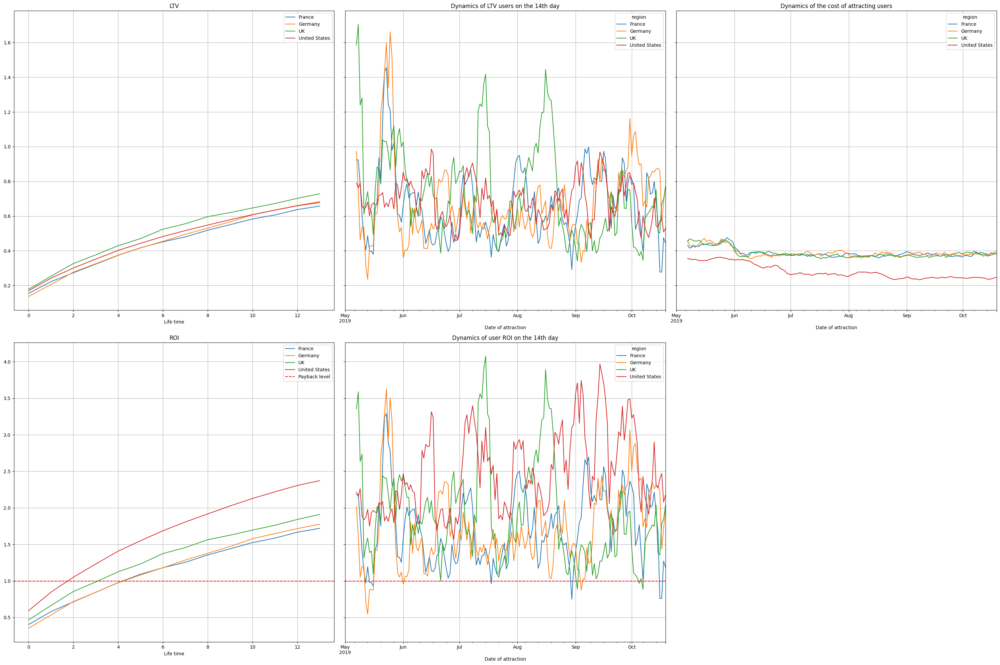

In [120]:
plot_ltv_roi(ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7)

**According to the graphs, we can say the following:**
1. The advertising campaign does not pay off.
2. The CAC is not constant, but grows over time, which coincides with our conclusions from the previous section.
3. Until the end of May, the advertising campaign paid off, but since June it has become unprofitable.
   Perhaps this is due to an increase in advertising costs, or perhaps less "high-quality users" have started coming.

##### Let's analyze the conversion rate, user retention and the dynamics of their changes.

In [77]:
# Let's call the functions for calculating metrics and visualizing them
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_not_organic,
    orders,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
)

In [78]:
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_not_organic,
    visits,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
)

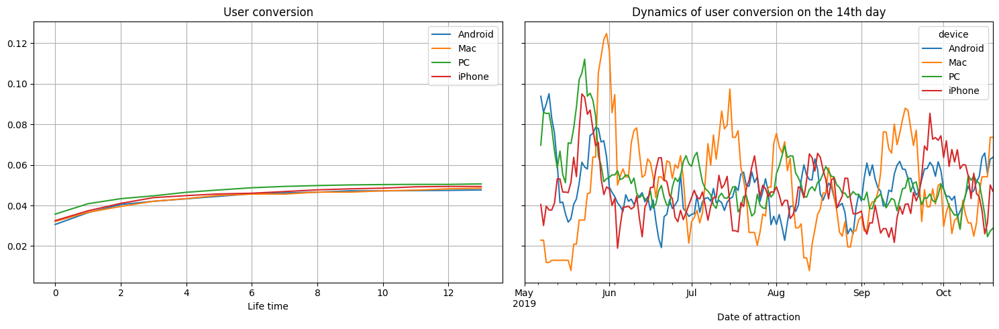

In [121]:
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

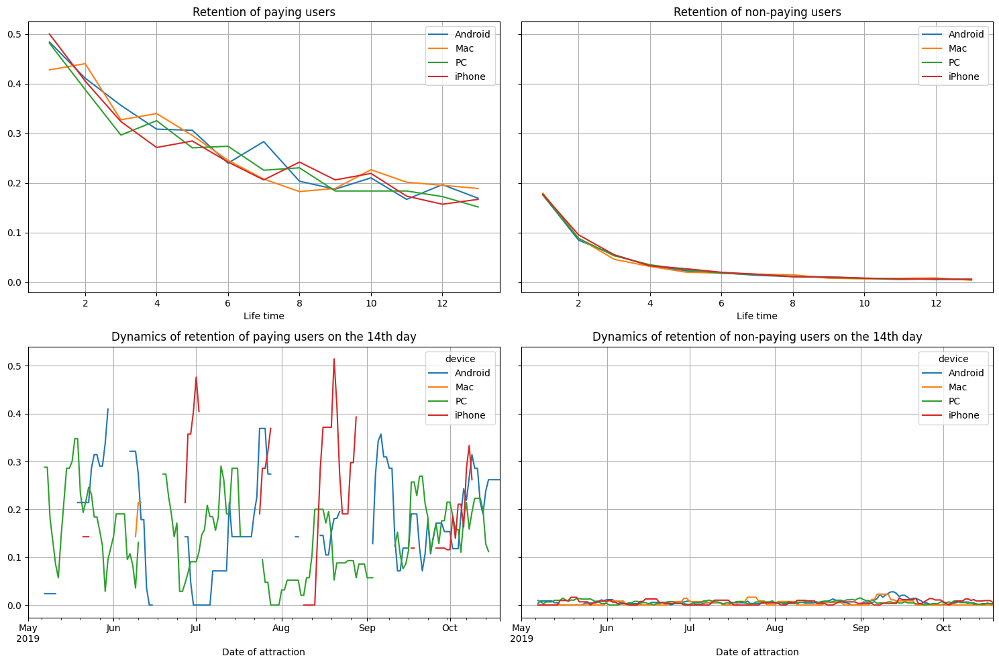

In [122]:
plot_retention(retention, retention_dynamic, horizon_days, window=7)

**According to conversion charts, it is not possible to determine the reason for the failure of the advertising company.**
**According to the schedule of retention of paying users, it can be seen that at the end of the lifetime the retention drops to a fairly low level, but what is the reason for this is still unclear. Retention of non-paying users is stable at a very low level.**
**According to the conversion dynamics graph, it can be seen that it changes a lot over time, apparently very different quality users were attracted during the advertising campaign.**

##### Let's analyze the payback of advertising by device

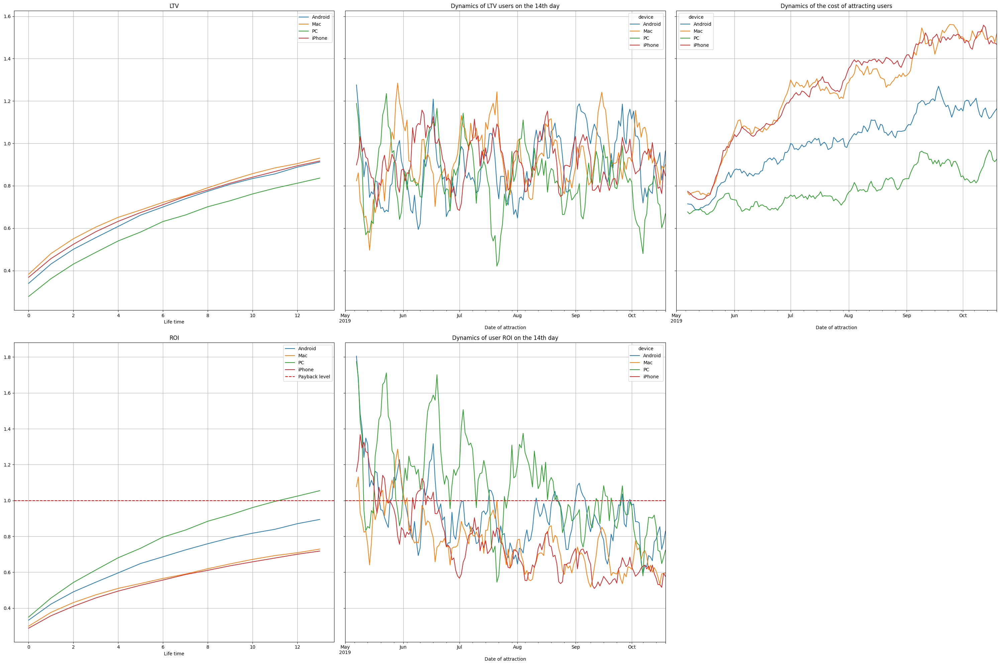

In [123]:
dimensions = ['device']

ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic = get_ltv(
    profiles_not_organic, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7
) 

**According to the graphs, we can say the following:**
1. Advertising paid off only on the PC. 
2. Mac devices, iPhones do not pay off stably, approximately, starting from the beginning of July.
3. Android does not pay off steadily, approximately, starting from mid-July
4. At the end of the advertising campaign, all devices stop paying off.
5. Advertising costs are growing on all devices, especially strongly on Mac and iPhone.

##### Let's analyze the payback of advertising by country

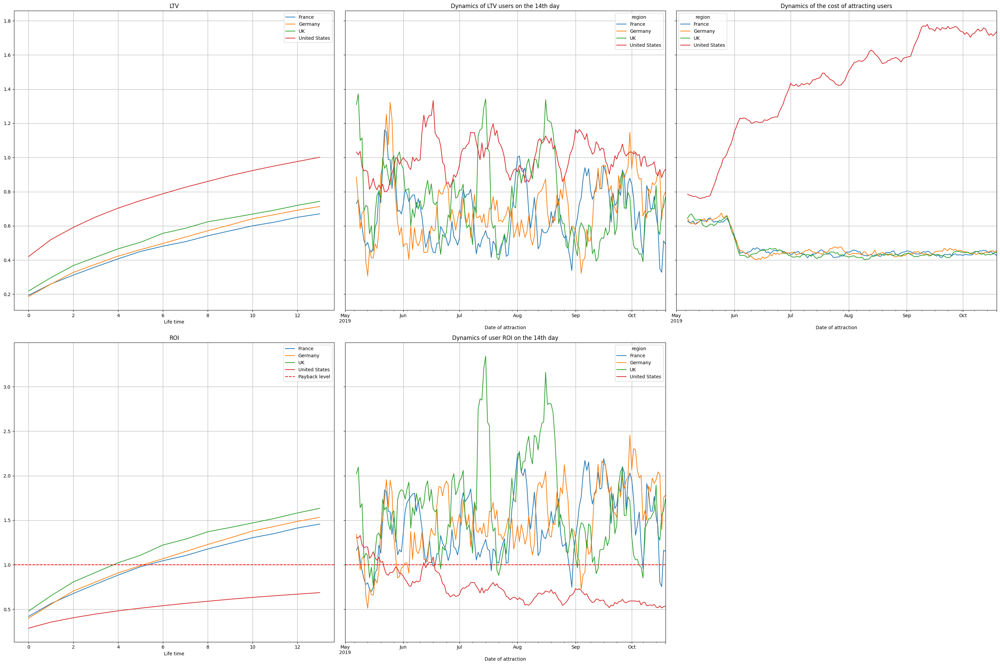

In [124]:
dimensions = ['region']

ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic = get_ltv(
    profiles_not_organic, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7
) 

**According to the graphs, we can say the following:**
1. Advertising in the USA does not pay off steadily, approximately, starting from the end of June.
2. The advertising campaign in other countries is steadily paying off, approximately, starting from mid-May.
3. The cost of an advertising campaign in the United States increases over time, for the rest of the countries they decrease in June and are stable thereafter.
4. At the same time, it is users from the USA who bring the company the greatest income, apparently since the most paying users came from there.

##### Let's analyze the payback of advertising by advertising channels

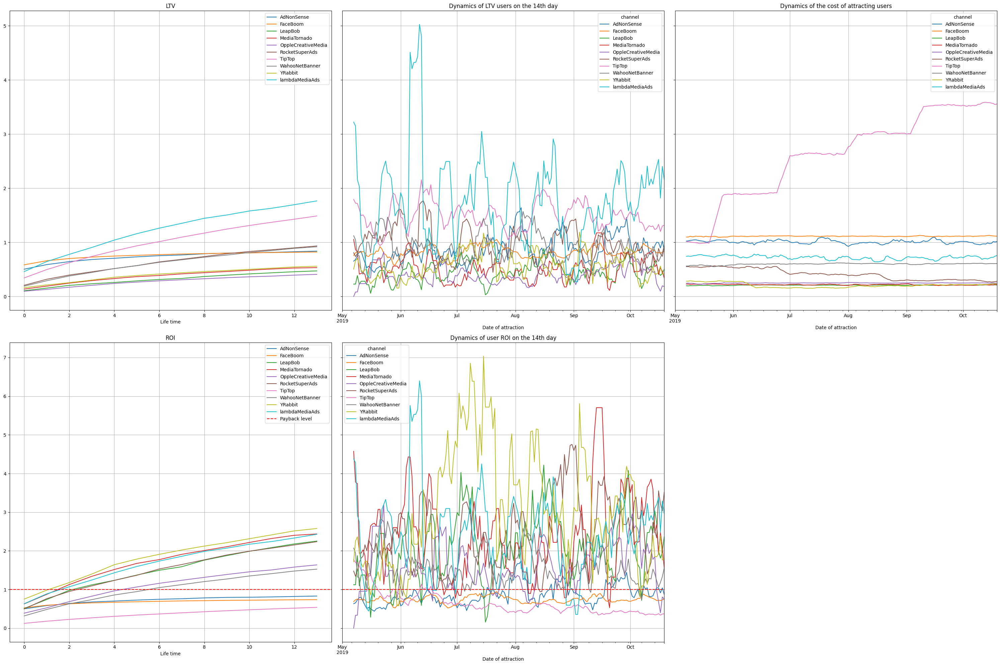

In [125]:
dimensions = ['channel']

ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic = get_ltv(
    profiles_not_organic, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7
) 

**According to the graphs, we can say the following:**
1. AdNonSense, FaceBoom, TipTop - unprofitable channels.
2. At the same time, FaceBoom, TipTop consistently do not pay off over time.
3. The cost of an advertising campaign in TipTop is steadily increasing over time.
4. lambdaMediaAds and Tip Top channels bring the company the most revenue.
5. Channels Y Rabbit, Media Tornado, lambdaMediaAds, LeapBob, Rocket Super Ads showed the best payback rates and they can be recommended to colleagues as channels where you can invest more money.

##### Also, for a complete picture, we will build retention and conversion charts broken down by advertising channels, devices, countries

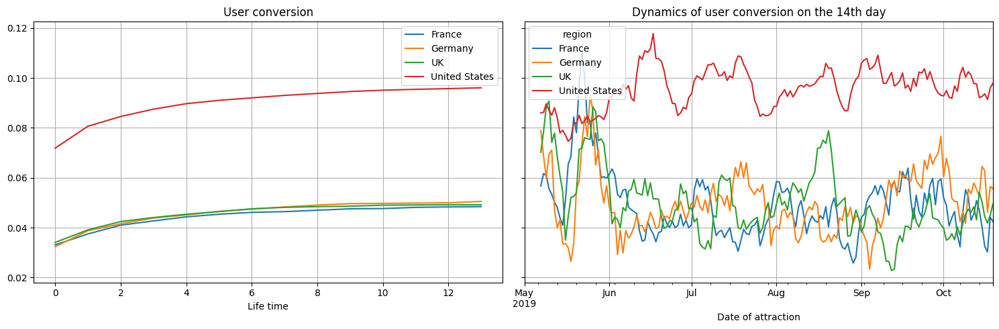

In [126]:
dimensions = ['region']
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_not_organic,
    orders,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

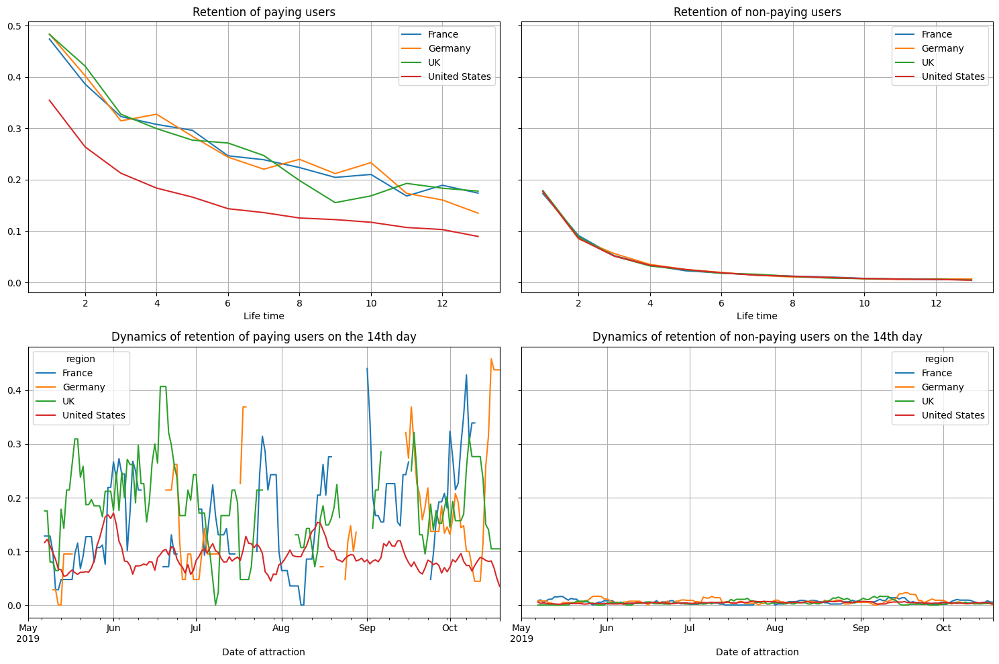

In [127]:
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_not_organic,
    visits,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_retention(retention, retention_dynamic, horizon_days, window=7)

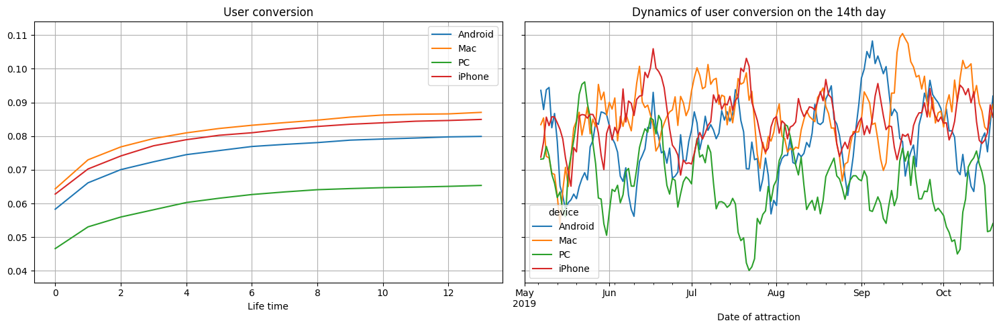

In [128]:
dimensions = ['device']
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_not_organic,
    orders,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

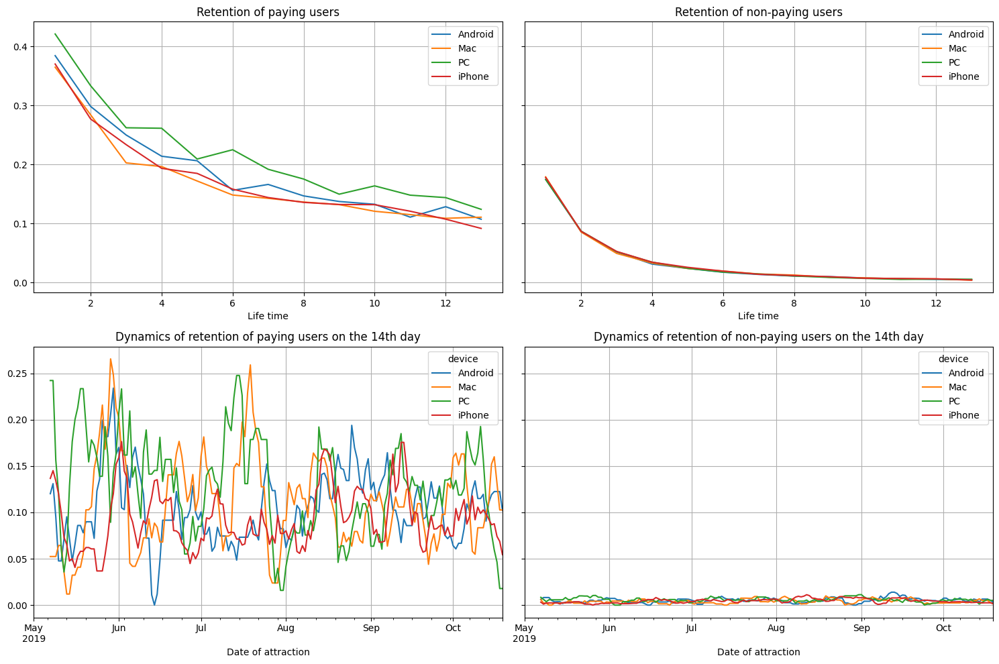

In [129]:
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_not_organic,
    visits,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_retention(retention, retention_dynamic, horizon_days, window=7)

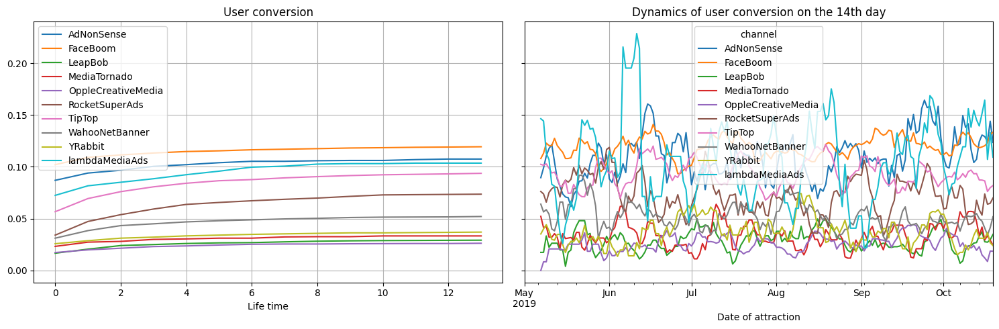

In [130]:
dimensions = ['channel']
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_not_organic,
    orders,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

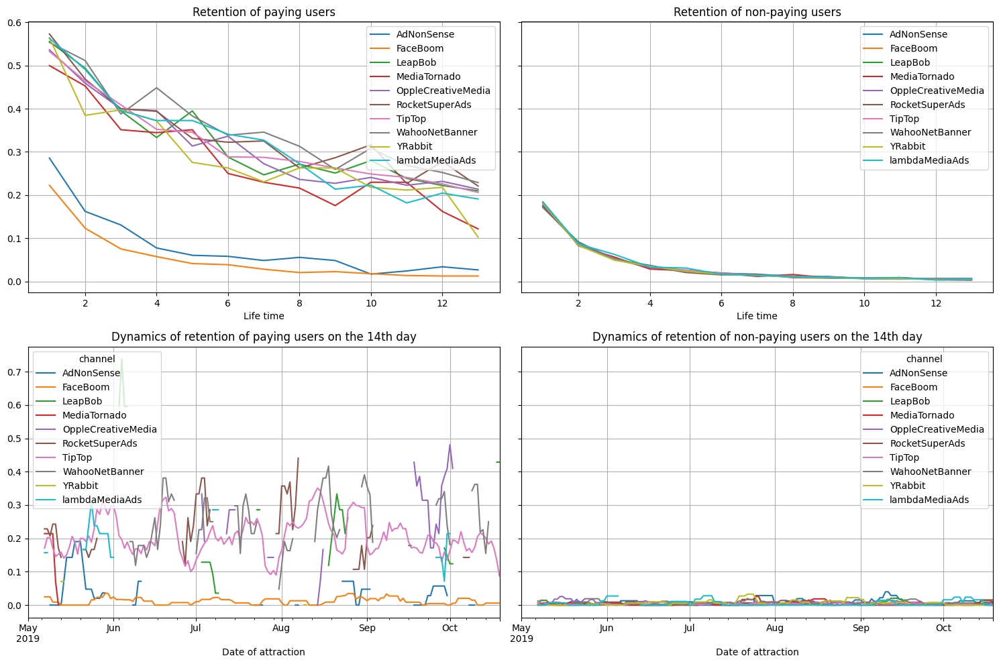

In [89]:
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_not_organic,
    visits,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_retention(retention, retention_dynamic, horizon_days, window=7)

**According to the graphs, we can say the following:**
1. The conversion rate of users from the USA is the best of all.
2. Retention of US users is the worst of all.
3. The conversion of iPhone and Mac users is the best of all.
4. Keeping users with iPhone and Mac is no different from keeping users with other devices.
5. Paying users who come from AdNonSense, FaceBoom, lambdaMediaAds have the best conversion rate.
6. Retention of paying users coming from Faceboom and AdNonSense is lower than that of other paid advertising channels.

##### We will answer a number of questions

Does advertising aimed at attracting users in general pay off?
Answer:
As part of the business plan, when users have to start paying off within 14 days, advertising does not pay off.

Which devices, countries and advertising channels can have a negative impact on the payback of advertising?
Answer:
iPhone, Android and Mac devices, AdNonSense, Faceboom and TipTop advertising sources have a negative impact on the payback of advertising, and the advertising company that takes place in the USA does not pay off either.

### Let's analyze the business indicators separately for the USA and Europe

##### Let's analyze business indicators for the USA

In [90]:
# Let's highlight users from the USA
profiles_usa = profiles_not_organic.query('region == "United States"')

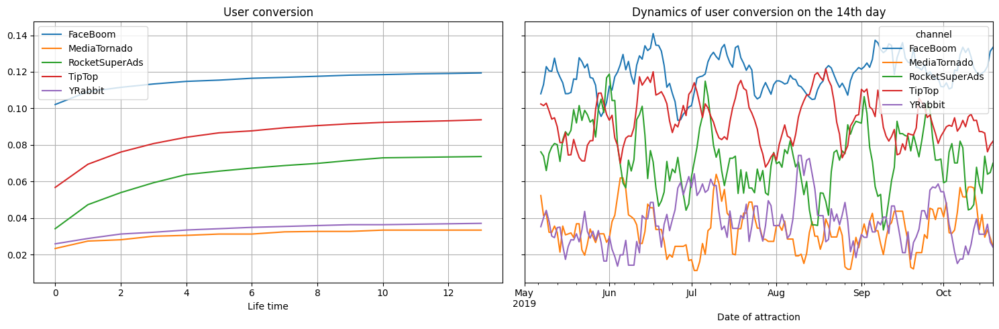

In [131]:
# Group users by advertising channel
dimensions = ['channel']

# We calculate and visualize the conversion
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_usa,
    orders,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

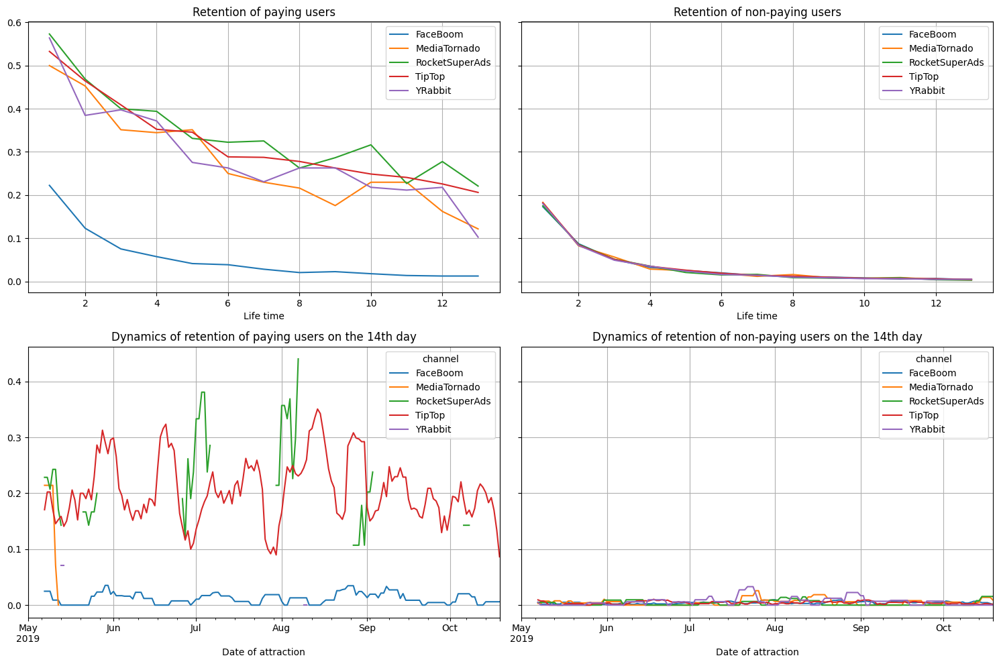

In [132]:
# We count and visualize retention
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_usa,
    visits,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_retention(retention, retention_dynamic, horizon_days, window=7)

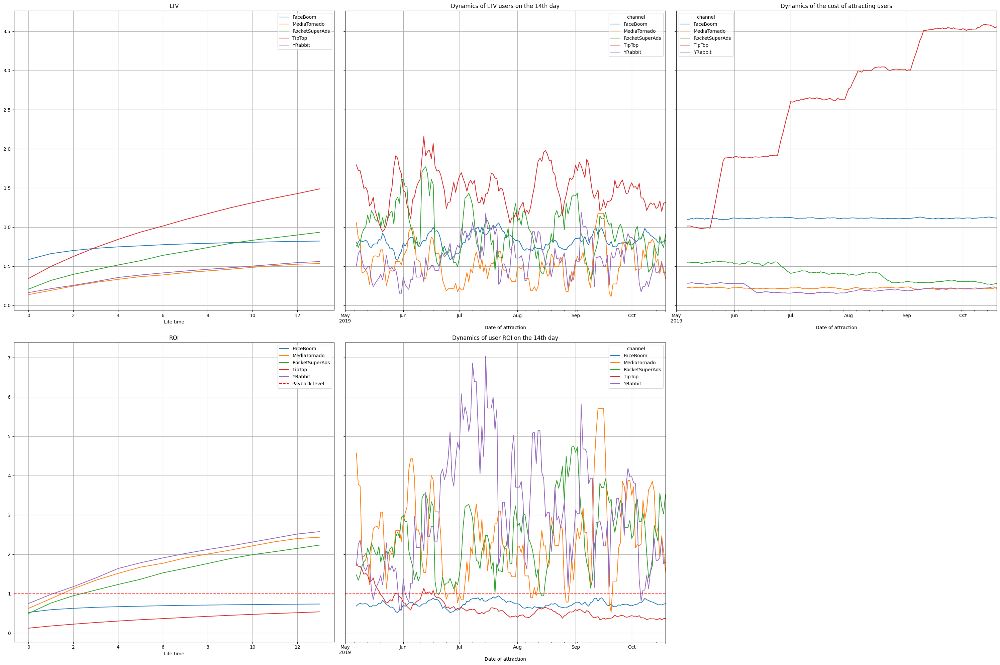

In [133]:
# We calculate and visualize business indicators
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic = get_ltv(
    profiles_usa, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7
) 

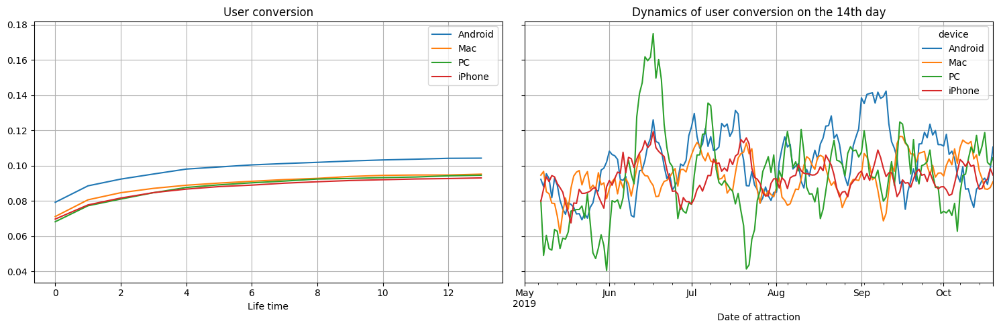

In [134]:
# Group users by device
dimensions = ['device']

# We calculate and visualize the conversion
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_usa,
    orders,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

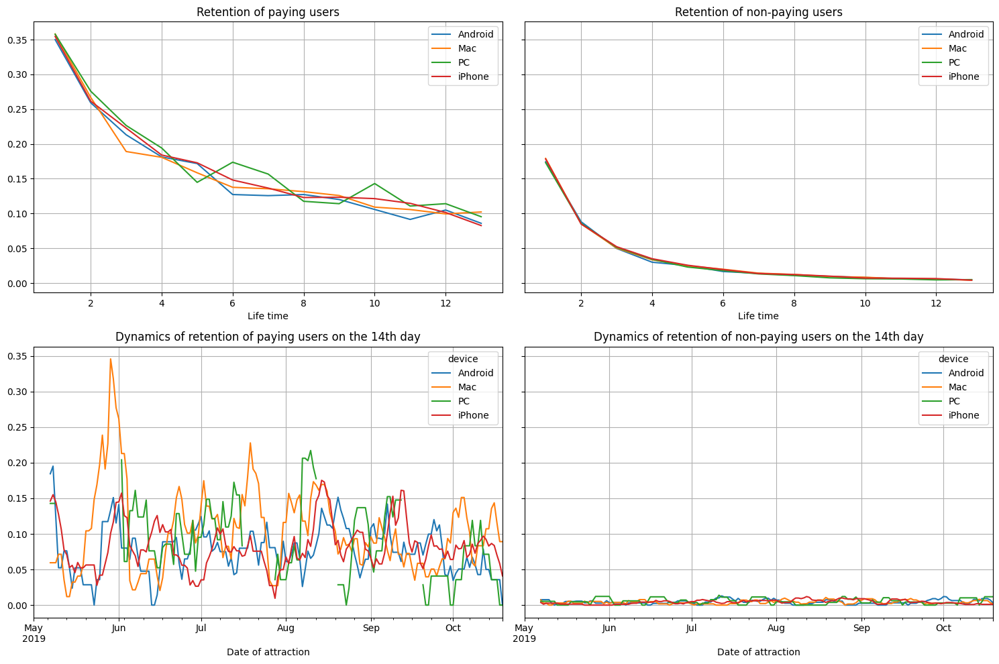

In [95]:
# Считаем и визуализируем удержание
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_usa,
    visits,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_retention(retention, retention_dynamic, horizon_days, window=7)

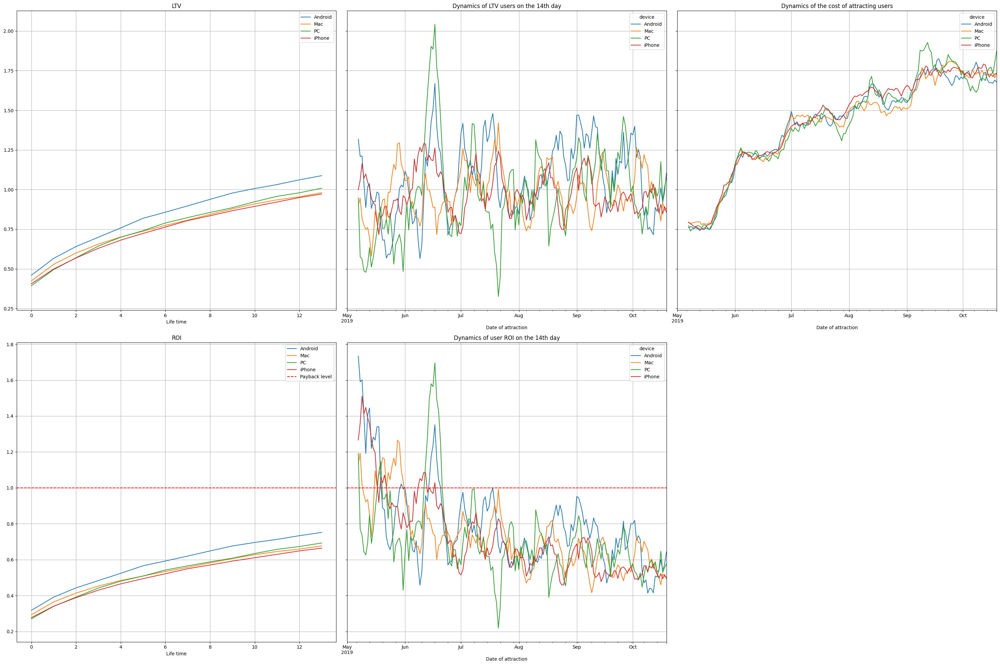

In [135]:
# We calculate and visualize business indicators
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic = get_ltv(
    profiles_usa, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7
) 

##### Let's analyze business indicators for Europe

In [97]:
# Let's highlight users from Europe
profiles_europe = profiles_not_organic.query('region != "United States"')

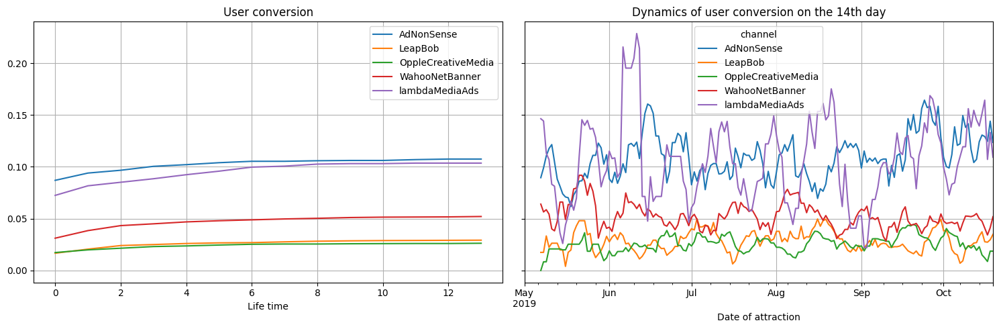

In [136]:
# Group users by advertising channel
dimensions = ['channel']

# We calculate and visualize the conversion
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_europe,
    orders,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

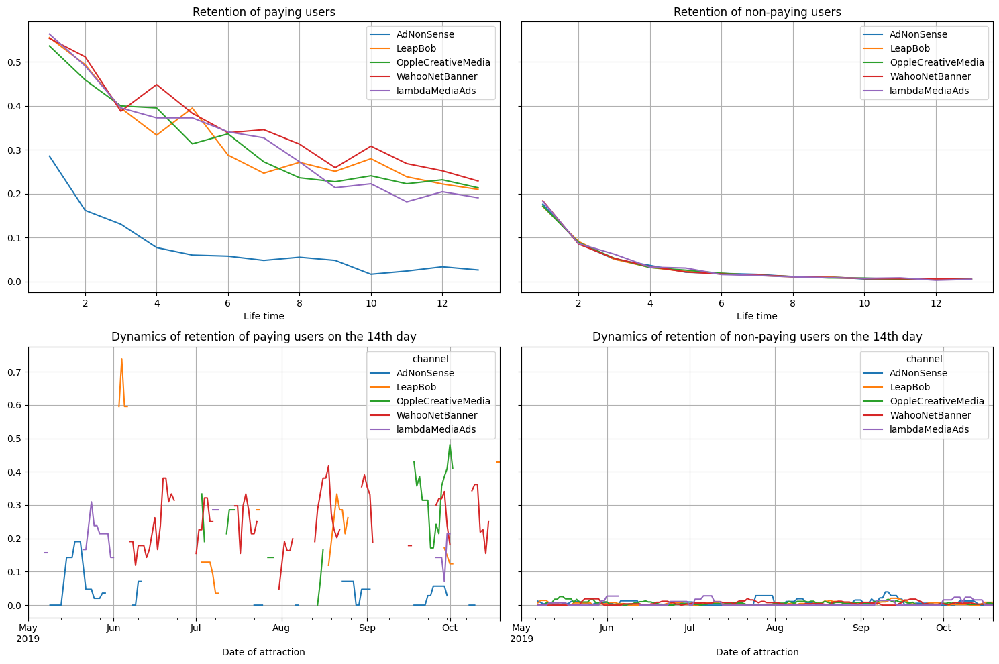

In [137]:
# We count and visualize retention
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_europe,
    visits,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_retention(retention, retention_dynamic, horizon_days, window=7)

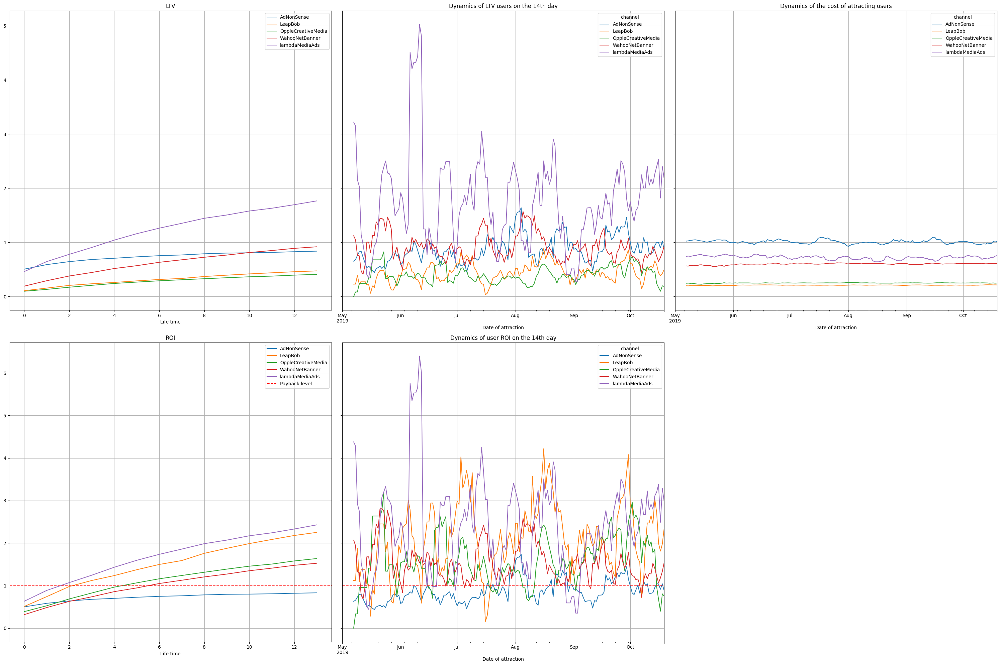

In [138]:
# We calculate and visualize business indicators
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic = get_ltv(
    profiles_europe, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7
) 

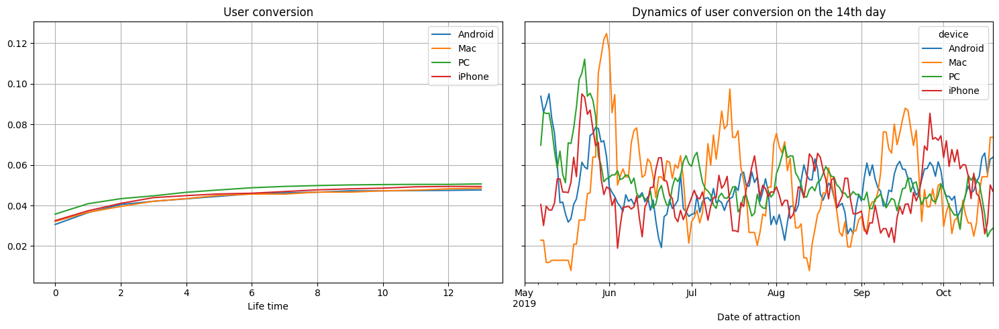

In [139]:
# Group users by device
dimensions = ['device']

# Считаем и визуализируем конверсию
conversion_raw, conversion, conversion_dynamic  = get_conversion(
    profiles_europe,
    orders,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_conversion(conversion, conversion_dynamic, horizon_days, window=7)

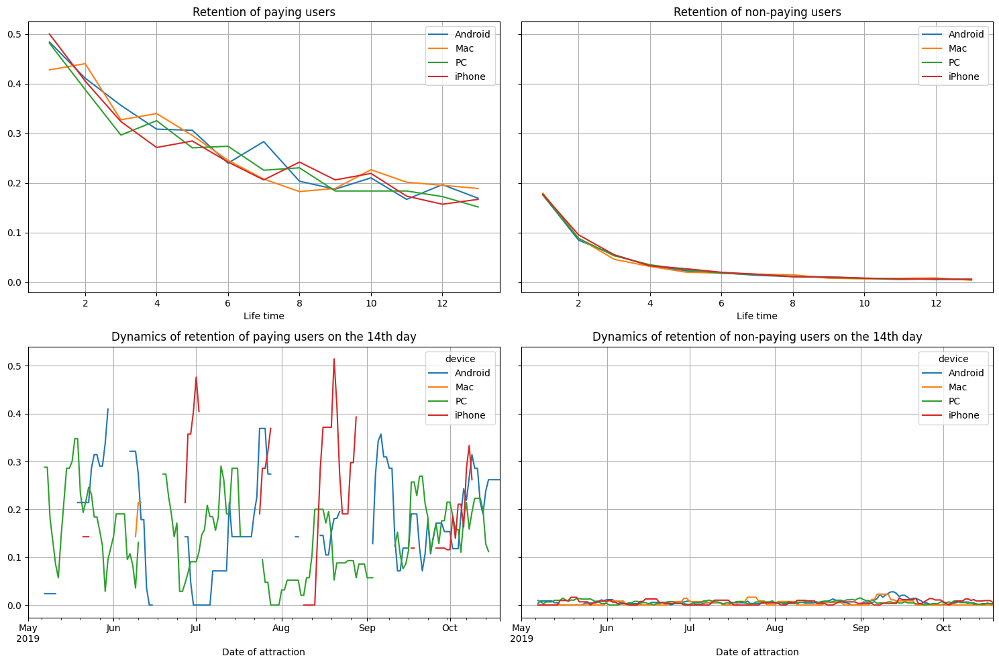

In [140]:
# We count and visualize retention
retention_raw, retention, retention_dynamic  = get_retention(
    profiles_europe,
    visits,
    observation_date,
    horizon_days,
    dimensions=dimensions,
    ignore_horizon=False,
)
plot_retention(retention, retention_dynamic, horizon_days, window=7)

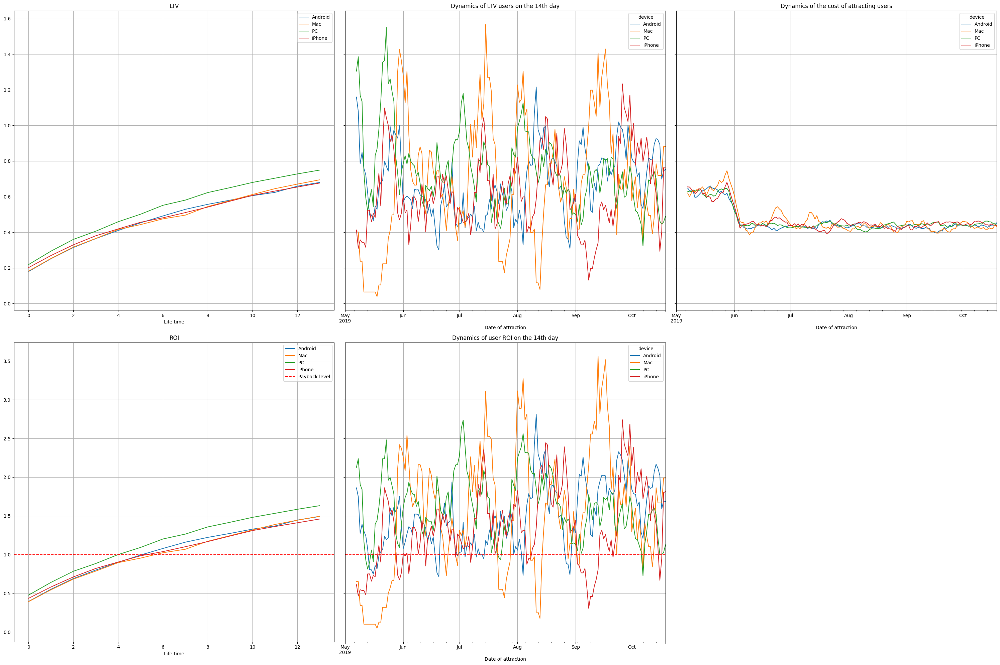

In [141]:
# We calculate and visualize business indicators
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic = get_ltv(
    profiles_europe, orders, observation_date, horizon_days, dimensions=dimensions
)

plot_ltv_roi(
    ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7
) 

**After dividing users into the USA and Europe and analyzing their indicators separately from each other, we can say the following:**
1. The company in the USA did not pay off because of two channels: Faceboom and TipTop.
2. There is also one problematic channel in Europe - AdNonSense.
3. The devices do not affect the payback of the company.

**Let's check our conclusions: if we exclude unprofitable channels, then business indicators for countries and devices should become payback.**

In [104]:
unprofitable = ['FaceBoom', 'AdNonSense', 'TipTop']
profiles_profitable = profiles_not_organic.loc[~profiles_not_organic['channel'].isin(unprofitable)]
profiles_profitable.head()

,user_id,first_ts,channel,device,region,dt,month,payer,acquisition_cost
4,31989216,2019-10-02 00:07:44,YRabbit,iPhone,United States,2019-10-02,2019-10-01,False,0.230769
9,59835779,2019-05-11 21:13:47,MediaTornado,iPhone,United States,2019-05-11,2019-05-01,False,0.250435
12,69985732,2019-10-09 21:36:33,RocketSuperAds,Mac,United States,2019-10-09,2019-10-01,False,0.251613
17,93828625,2019-07-24 05:56:22,LeapBob,iPhone,Germany,2019-07-24,2019-07-01,False,0.204324
24,138399008,2019-07-20 16:59:16,WahooNetBanner,PC,UK,2019-07-20,2019-07-01,False,0.635294


In [142]:
# First, let's check the payback in general
observation_date = datetime(2019, 11, 1).date()  # moment of analysis
horizon_days = 14  # horizon of analysis
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic  = get_ltv(
    profiles_profitable,
    orders,
    observation_date,
    horizon_days,
    dimensions=[],
    ignore_horizon=False,
)

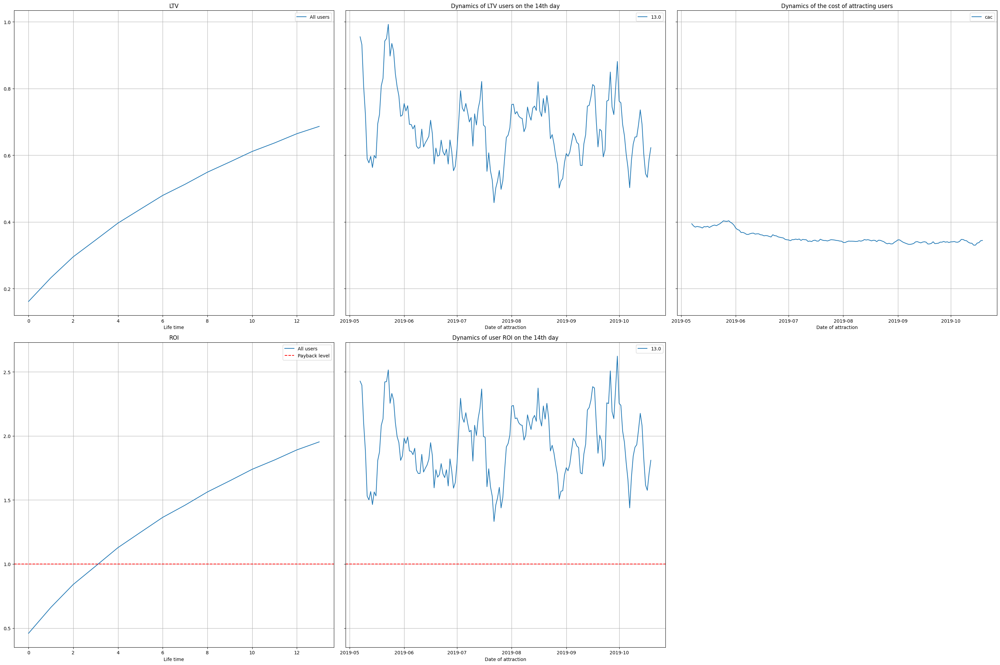

In [143]:
plot_ltv_roi(ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7)

**We see that without unprofitable channels, the company pays off.**

##### Let's check that the company pays off by country and device

In [144]:
observation_date = datetime(2019, 11, 1).date()  # moment of analysis
horizon_days = 14  # horizon of analysis
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic  = get_ltv(
    profiles_profitable,
    orders,
    observation_date,
    horizon_days,
    dimensions=['device'],
    ignore_horizon=False,
)

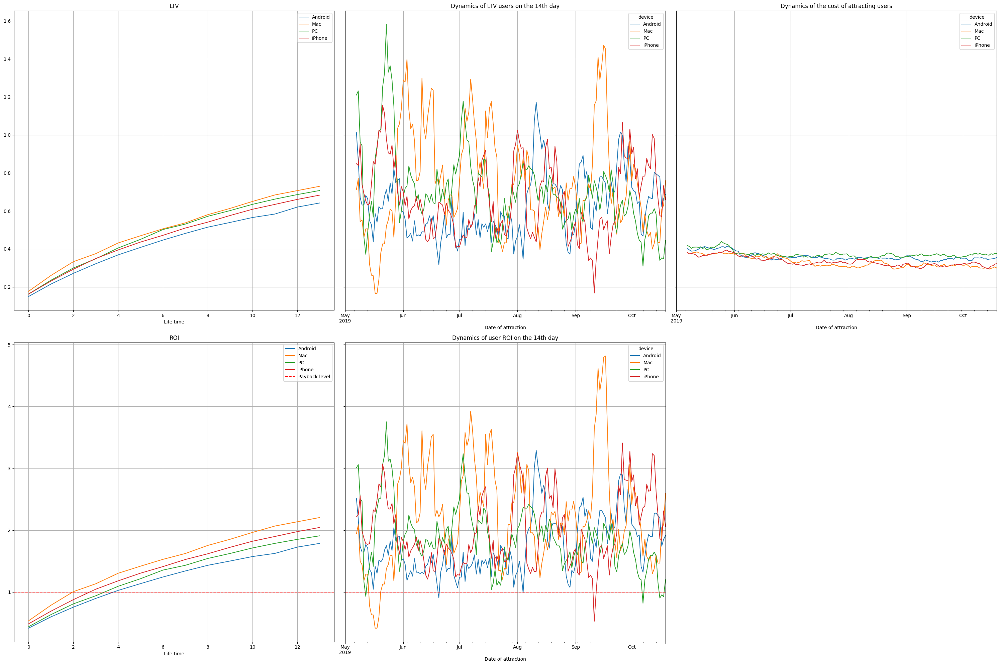

In [145]:
plot_ltv_roi(ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7)

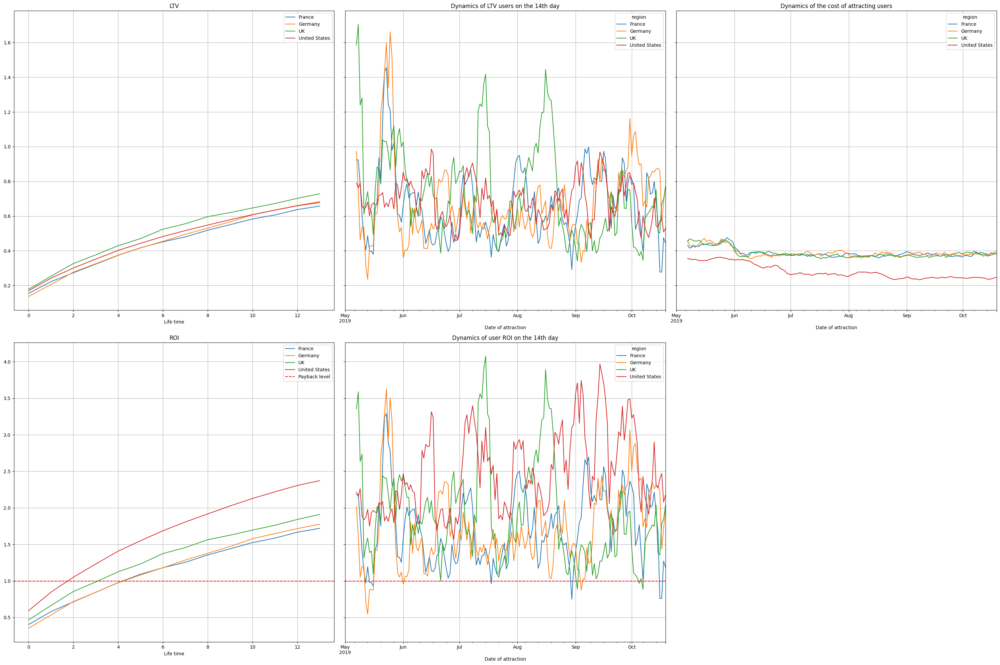

In [146]:
observation_date = datetime(2019, 11, 1).date()  # moment of analysis
horizon_days = 14  # horizon of analysis 
ltv_raw, ltv, ltv_dynamic, roi, roi_dynamic  = get_ltv(
    profiles_profitable,
    orders,
    observation_date,
    horizon_days,
    dimensions=['region'],
    ignore_horizon=False,
)

plot_ltv_roi(ltv, ltv_dynamic, roi, roi_dynamic, horizon_days, window=7)

**We see that without unprofitable channels, the company pays off, both by country and by device.**

##### Question: What can cause the problems of payback?
Answer:
1. The company in the USA did not pay off because of two channels: Faceboom and TipTop.
   TipTop - due to high advertising costs.
   Faceboom - due to low retention
2. In Europe, the company did not pay off in the AdNonSense channel, even despite the decrease in investments there with the progress of the advertising company.
These two factors eventually led to the fact that the advertising company did not pay off.

### General conclusion on the project
In this project, we analyzed the data of the Procrastinate Pro+ entertainment application. Our task was to understand the reasons for the unprofitability of the advertising company, which took place from May 1 to October 27, 2019, and help the company to go into the plus.

The project is divided into several parts: in the first part, we studied the general information about the submitted data and checked them for omissions and duplicates. No duplicates or omissions were found.

In the second part, we set functions for calculating and analyzing LTV, ROI, retention and conversion and checked the correctness of their work.

In the third part, we were engaged in research analysis of data and studied information about users. We were able to establish the following:
1. The minimum date for attracting users is May 1, 2019.
2. The maximum date for attracting users is October 27, 2019.
3. Users come from the USA, Great Britain, France, Germany.
4. Most of the paying users are in the USA.
5. Users use iPhone, Android, PC, Mac.
6. Mac accounts for the most paying users.
7. Most of the paying users came from FaceBoom, AdNonSense, lambdaMediaAds.
8. Most of the users came through an organic traffic source.

In the fourth part, we studied marketing costs. We were able to establish the following:
1. The advertising campaign was held from 1.05.2019 to 27.10.2019, 105,497 rubles were spent on it
2. Most of the funds were invested in TipTop and FaceBoom advertising sources.
3. The cost of advertising in FaceBoom has been constantly growing, while the cost of other sources has hardly changed over time.
4. The highest cost of attracting one user from TipTop and FaceBoom sources.

In the fifth part, we evaluated the payback of advertising and drew conclusions from the data obtained. We were able to establish the following:
1. As part of the business plan, when users have to start paying off within 14 days, advertising does not pay off.
2. Android, iPhone and Mac devices, AdNonSense, Faceboom and TipTop advertising sources have a negative impact on the payback of advertising, and the advertising company taking place in the USA does not pay off either.
3. Payback problems can be caused by the following factors:
   The company in the USA did not pay off because of two channels: Faceboom and TipTop.
   TipTop - due to high advertising costs.
   Faceboom - due to low retention.
   In Europe, the company did not pay off in the AdNonSense channel, even despite the decrease in investments there with the progress of the advertising company.
   These two factors eventually led to the fact that the advertising company did not pay off.
4. YRabbit, MediaTornado, lambdaMediaAds, LeapBob, RocketSuperAds channels showed the best payback rates.

Recommendations that can be given to colleagues from the advertising department:
1. Refuse to use AdNonSense, Faceboom and TipTop advertising channels, and redirect the released funds to YRabbit, MediaTornado, lambdaMediaAds, LeapBob, RocketSuperAds channels.
2. If it is impossible to refuse AdNonSense and Faceboom channels, since a lot of paying users come through them, then it is worth trying to improve retention in these channels.
3. In my opinion, the TipTop channel should be abandoned, since it does not justify investing in it.
4. Try to work with organic users, as there are most of them, but they are practically not converted into buyers.